In [1]:
import sys, re, os
import numpy as np

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 11})

plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 300

In [3]:
import itertools
marker = itertools.cycle(('x',',', '+', '.', 'o', '*'))
cycol = itertools.cycle('bgrcmk')

In [4]:
# Some helper functions
def get_stat(stat_name, source="general/fastclick-varied-cbr-rates.csv", index=1):
    stat = []
    with open(source) as file:
        for line in file:
            if re.search(stat_name, line):
                stat.append(line.strip().split(',')[index])
    
    return list(map(lambda x:float(x), stat[:-1]))

def plot_stat(stat_name, ax, source, index=1):
    stat = get_stat(stat_name, source, index)
    ax.plot(stat)
    ax.grid(True)
    ax.set_title(stat_name)

def plot_stats(stat_names, source="fastclick-varied-cbr-rates.csv", index=1):
    i = 1
    fig, ax = plt.subplots(len(stat_names),2)
    for s in stat_names:
        ax = plt.subplot(len(stat_names),1, i)
        plot_stat(s, ax, source, index)
        i+=1
    fig.tight_layout()

### Service chain configuration:

In [5]:
from IPython.display import IFrame
IFrame("./tree.pdf", width=600, height=420)

In [194]:
# Metadata for specific SFC configurations
exp_ls = "exp6"
exp_rs = "exp-4-1-1"
vnfs = ["flow_tracker.csv", "nf_router.csv", "ndpi_stats.csv", "payload_scan.csv",]

## Load stimulus experiments
### High-level KPIs: 

In [195]:
def parse_seq(exp_type, exp_num, file, index=5):
    "Parse sequential data, specialized for the TX/RX/Latency experiments"
    tmp = []
    
    if file.startswith("latency.csv"):
        with open(os.path.join(exp_type, exp_num, file)) as f:
            lines = f.readlines()[4:] if exp_type == "load_stimulus" else f.readlines()
            for line in lines:
                tmp.append(float(line.strip())/1000)
    else:
        with open(os.path.join(exp_type, exp_num, file)) as f:
            next(f)
            for l in f:
                tmp.append(float(l.strip().split(",")[index]))
                
    return tmp

In [196]:
def parse_reg(exp_type, exp_num, file, stat_name, index=1):
    "Parse the Perf data"
    stat = []
    with open(os.path.join(exp_type, exp_num, file)) as file:
        for line in file:
            if re.search(stat_name, line):
                stat.append(line.strip().split(',')[index])
    
    return list(map(lambda x:float(x), stat[:-1]))

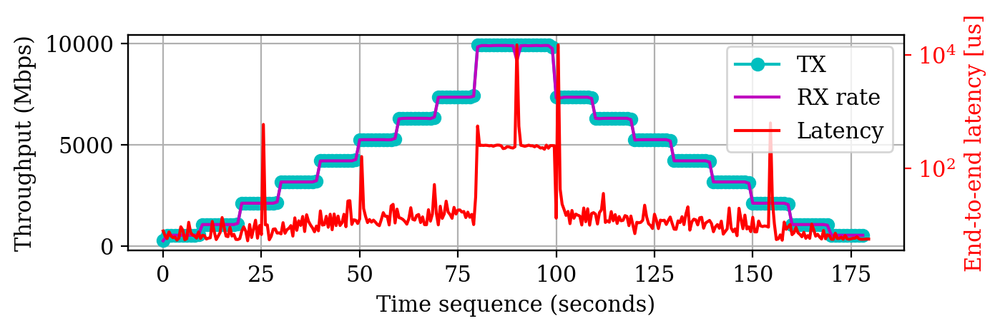

In [225]:
fig, ax = plt.subplots(figsize = (7,2))
ax.grid(True)
ax.set_xlabel("Time sequence (seconds)")
ax.set_ylabel("Throughput (Mbps)")

ax2 = ax.twinx()
ax2.tick_params(axis='y', colors='red')
ax2.set_ylabel("End-to-end latency [us]", color="red")

l = ax.plot(parse_seq("load_stimulus", exp_ls, "tx_stats.csv"), marker=next(marker), color=next(cycol), label="TX")
l1 = ax.plot(parse_seq("load_stimulus", exp_ls, "rx_stats.csv"), color=next(cycol), label="RX rate")
lat = parse_seq("load_stimulus", exp_ls, "latency.csv")
ax2.set_yscale("log")
l2 = ax2.plot(0.5*np.arange(0, len(lat)), lat, color="red", label="Latency")

lns = l+l1+l2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs)

### Instruction rate: instructions per second and per clock cycle

In [198]:
def init_plt(ax2_title):
    fig, ax = plt.subplots(figsize = (7,2))
    ax.grid(True)
    ax.set_xlabel("Time sequence (seconds)")
    ax.set_ylabel("Throughput (Mbps)")

    ax2 = ax.twinx()
    ax2.tick_params(axis='y', colors='red')
    ax2.set_ylabel(ax2_title, color="red")
    
    return fig, ax, ax2

In [199]:
def plot_feature(feature, label, index=1):
    fig, ax, ax2 = init_plt(label)
    tx = parse_seq("load_stimulus", exp_ls, "tx_stats.csv")
    lns = ax.plot(tx, marker=next(marker), color=next(cycol), label="TX")

    for v in vnfs:
        data = parse_reg("load_stimulus", exp_ls, v, feature, index)
        lns += ax2.plot(data, color=next(cycol), label=v.split(".")[0])

    labs = [l.get_label() for l in lns]
    plt.legend(lns, labs, loc=1, bbox_to_anchor=(1, 1.2), ncol=6, prop={'size': 7})

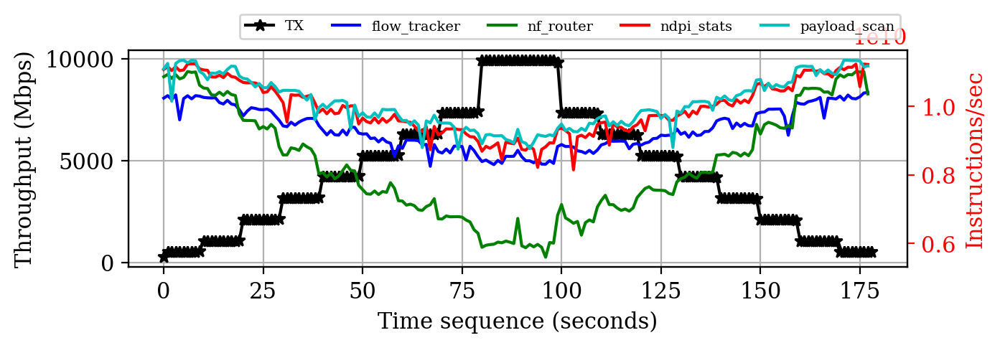

In [226]:
plot_feature("instructions", "Instructions/sec")

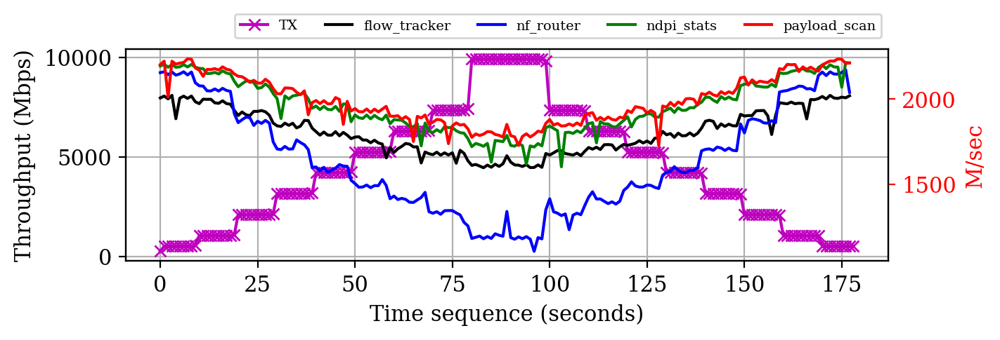

In [227]:
plot_feature("branches,", "M/sec", 7)

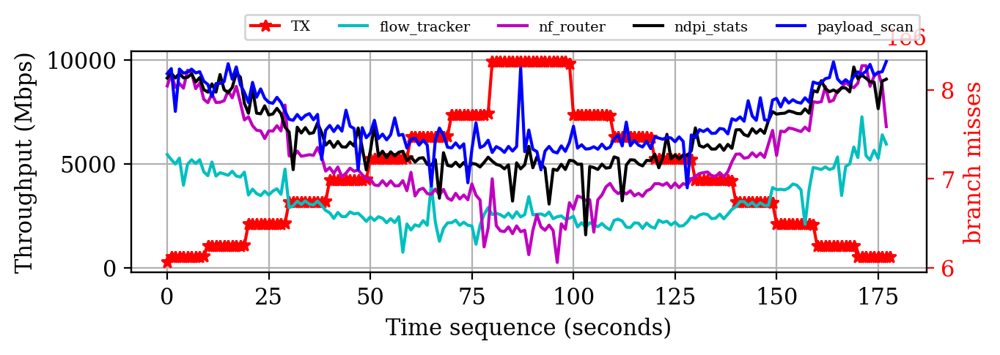

In [202]:
plot_feature("branch-misses,", "branch misses")

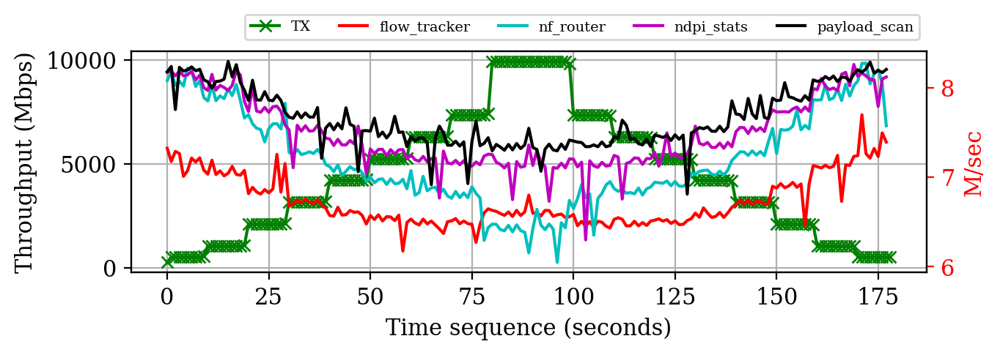

In [203]:
plot_feature("branch-load-misses,", "M/sec", 7)

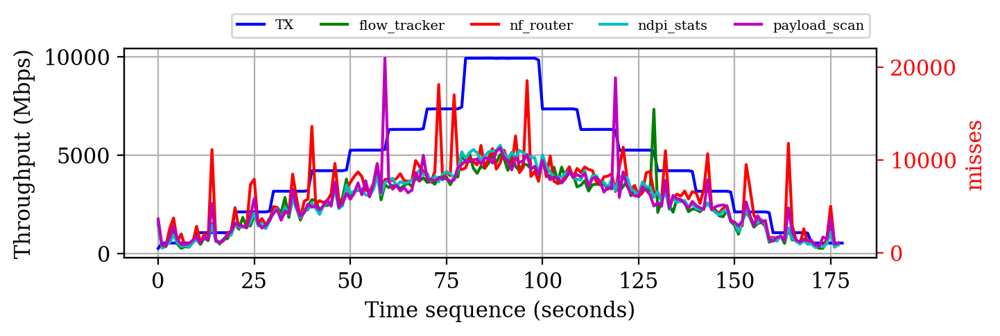

In [204]:
plot_feature("cache-misses", "misses", )

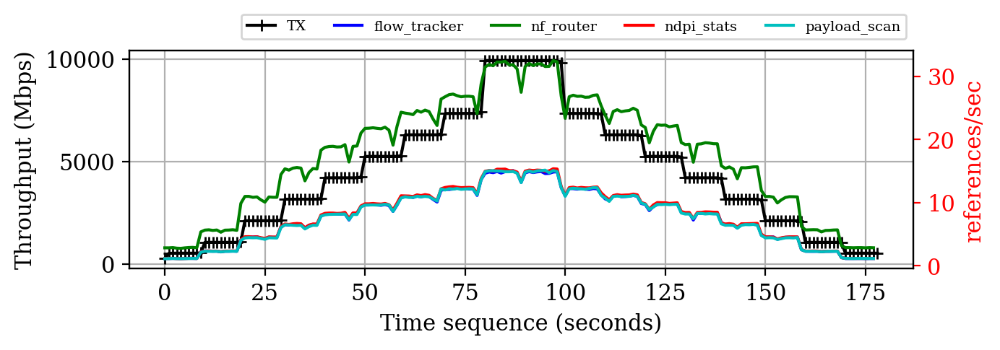

In [205]:
plot_feature("cache-references", "references/sec", 7)

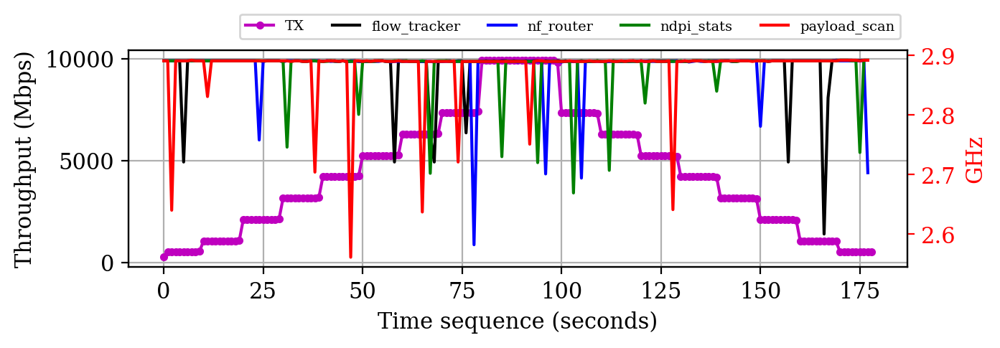

In [206]:
plot_feature(",cycles,", "GHz", 7)

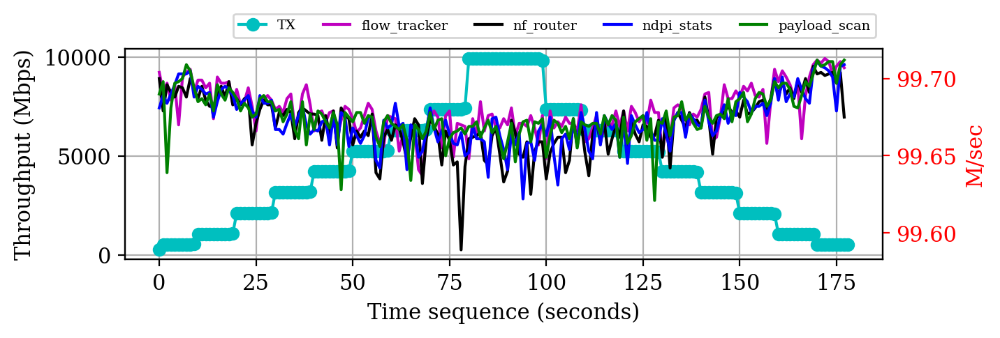

In [207]:
plot_feature("bus-cycles", "M/sec", 7)

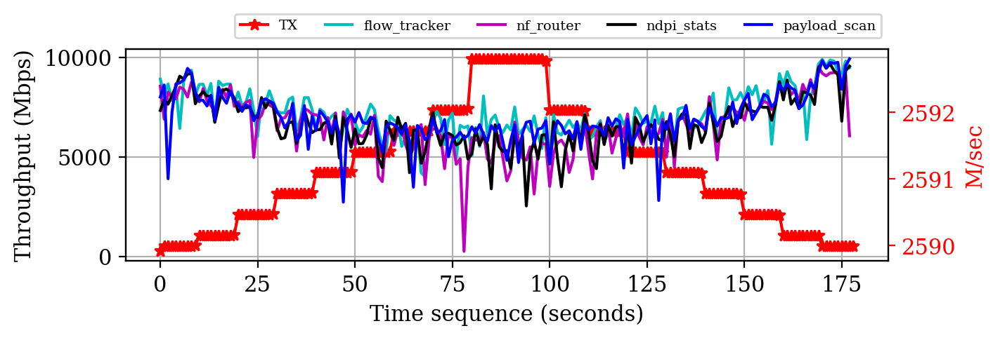

In [208]:
plot_feature("ref-cycles", "M/sec", 7)

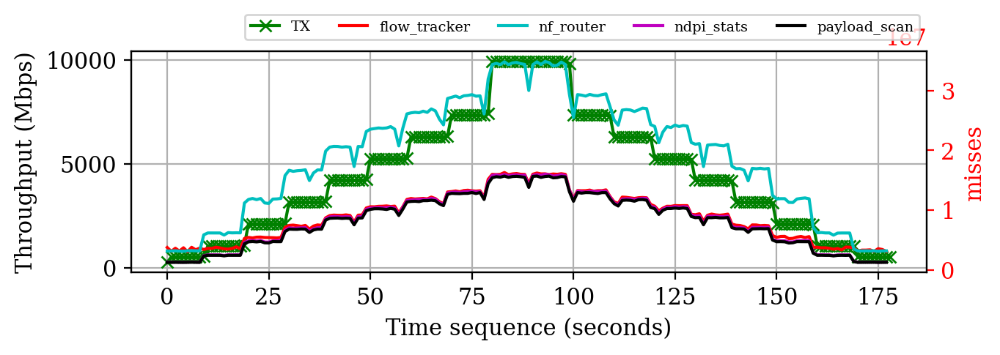

In [209]:
plot_feature("L1-dcache-load-misses", "misses")

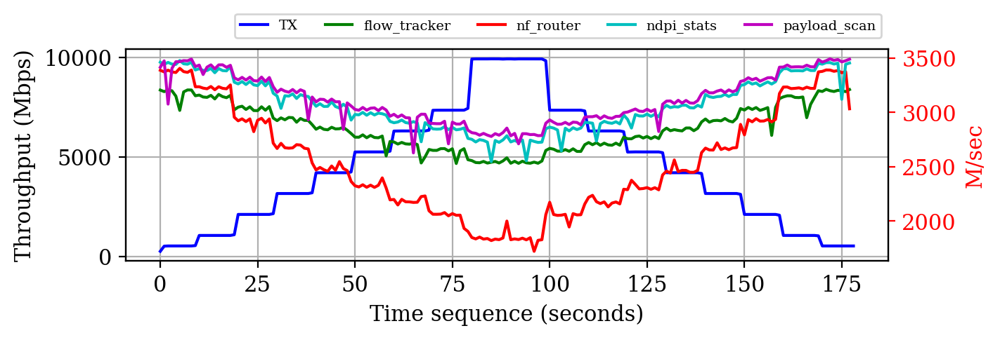

In [210]:
plot_feature("L1-dcache-loads", "M/sec", 7)

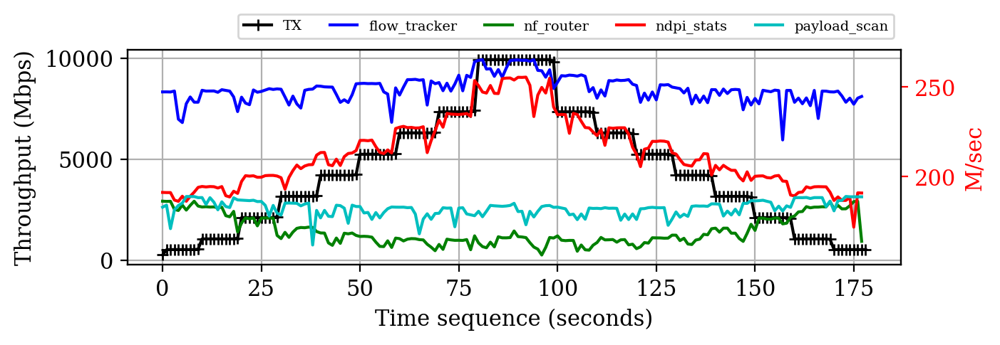

In [211]:
plot_feature("L1-dcache-stores", "M/sec", 7)

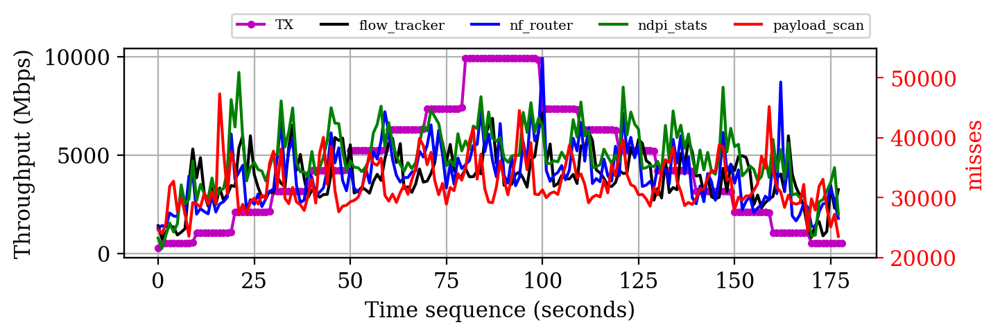

In [212]:
plot_feature("L1-icache-load-misses", "misses", )

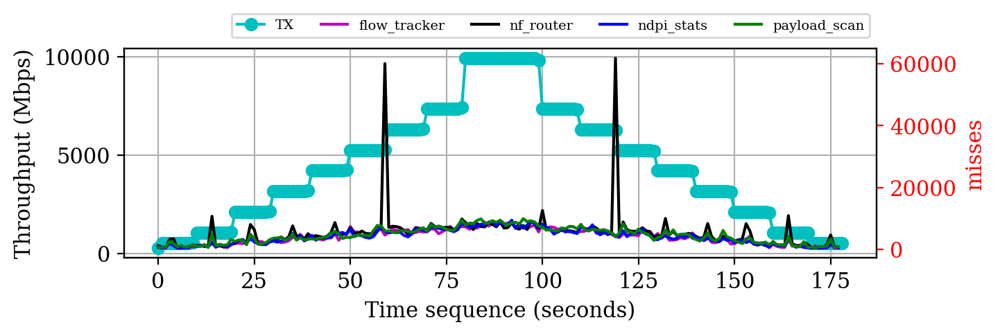

In [213]:
plot_feature("LLC-load-misses", "misses", )

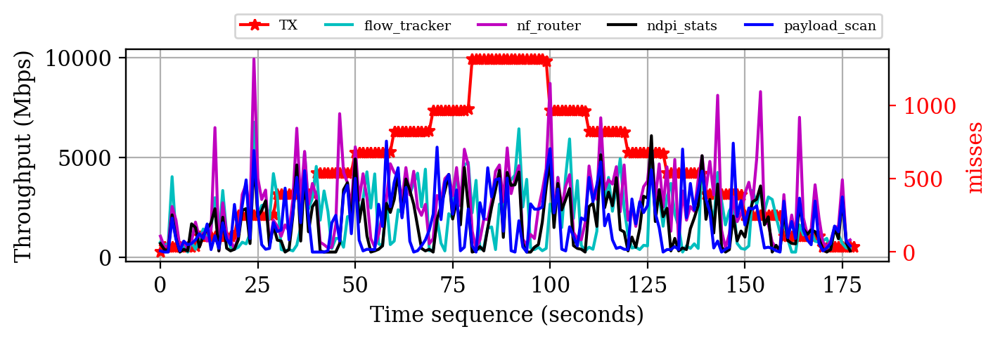

In [214]:
plot_feature("LLC-store-misses", "misses", )

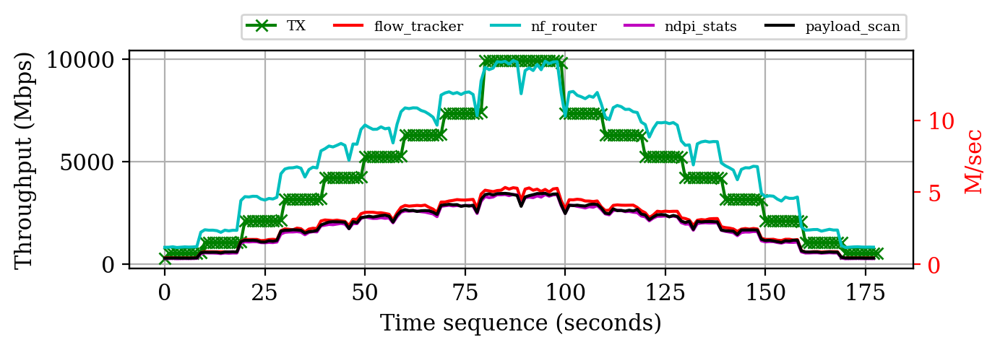

In [215]:
plot_feature("LLC-stores", "M/sec", 7)

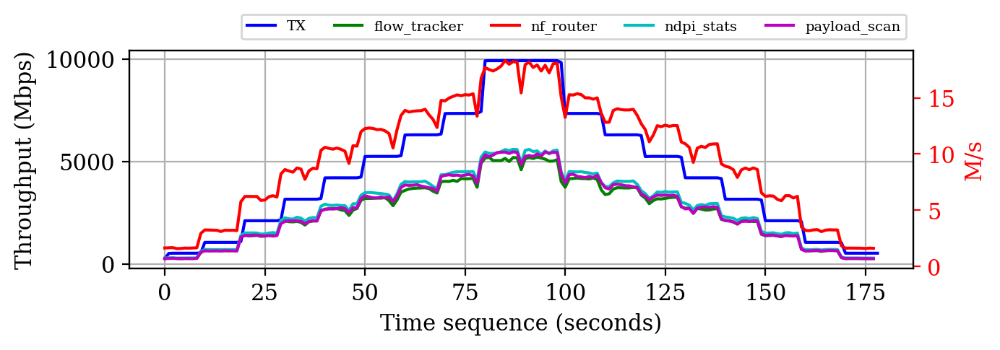

In [216]:
plot_feature("LLC-loads", "M/s", 7)

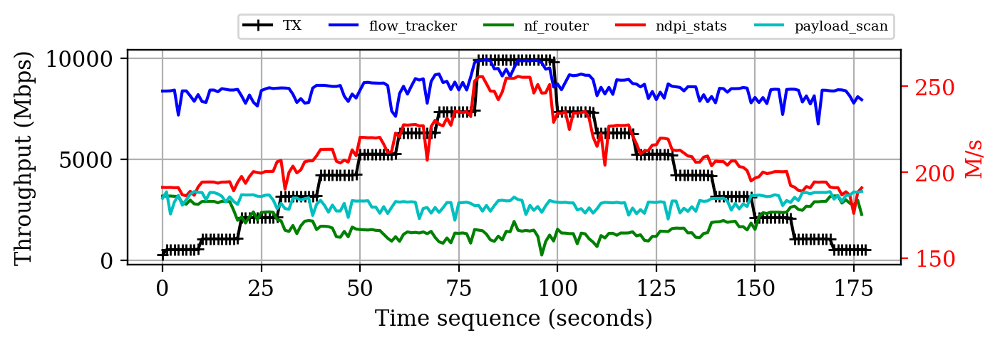

In [217]:
plot_feature("dTLB-stores", "M/s", 7)

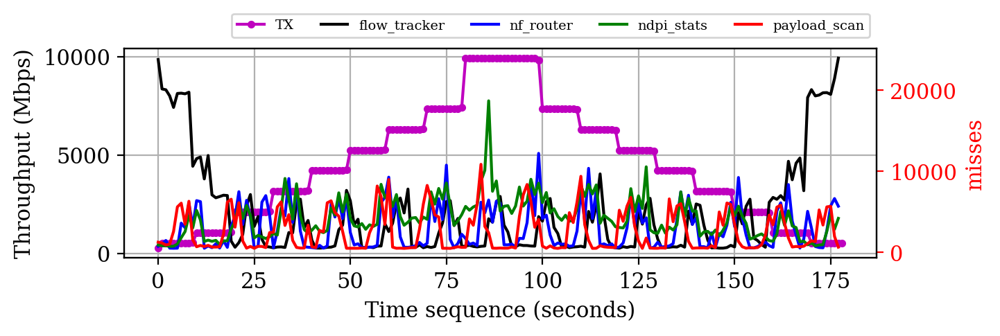

In [218]:
plot_feature("dTLB-load-misses", "misses",)

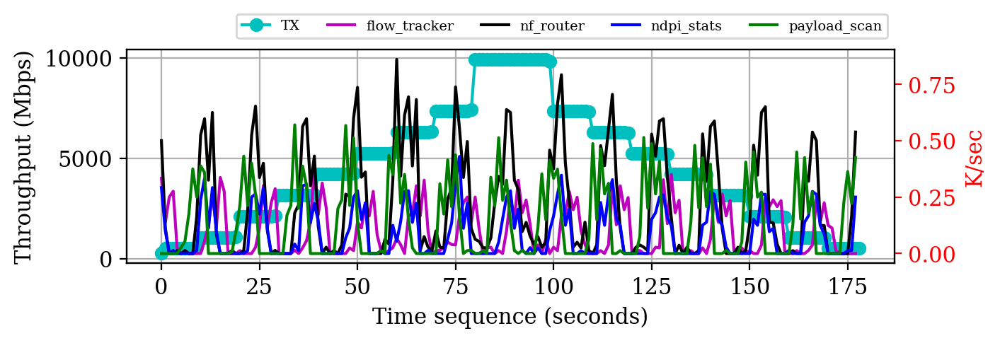

In [219]:
plot_feature("dTLB-store-misses", "K/sec", 7)

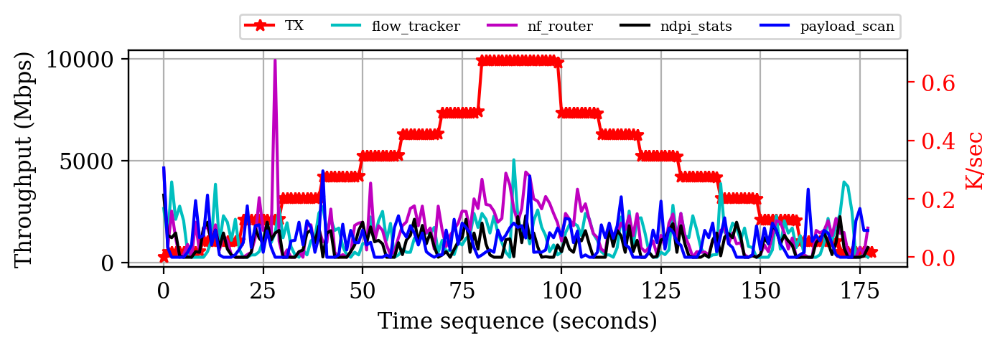

In [220]:
plot_feature("iTLB-loads", "K/sec", 7)

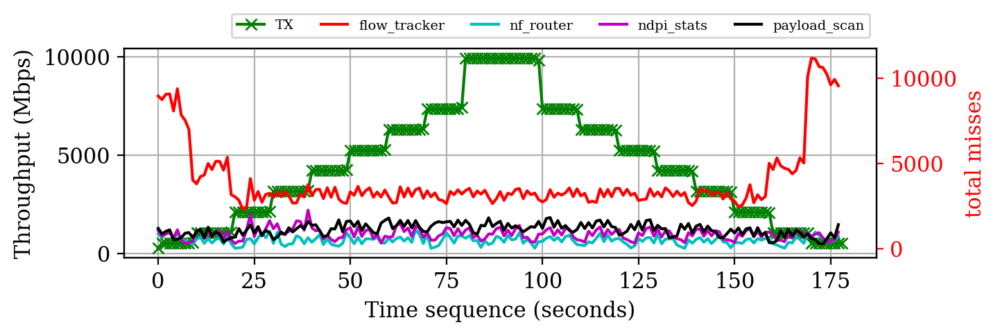

In [221]:
plot_feature("iTLB-load-misses", "total misses",)

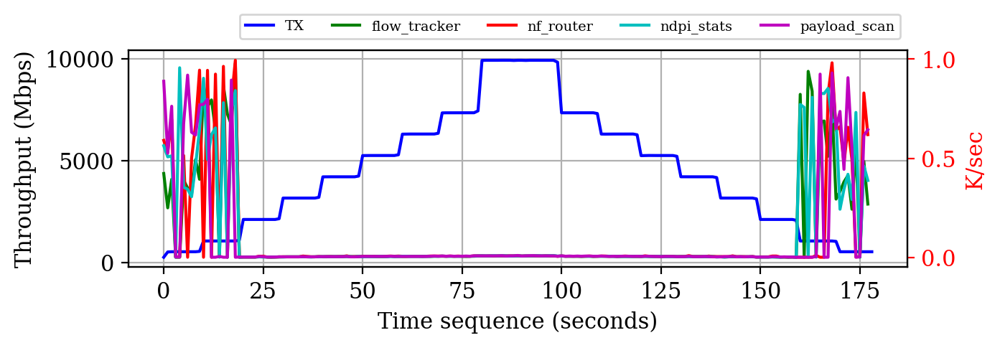

In [222]:
plot_feature("node-loads", "K/sec", 7)

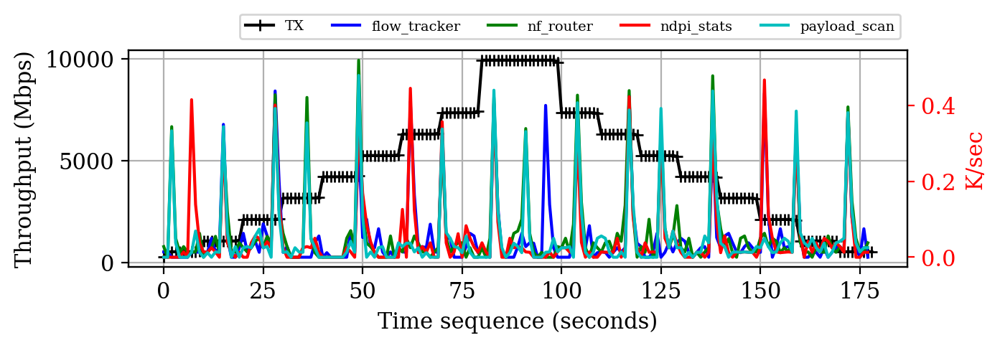

In [223]:
plot_feature("node-store-misses", "K/sec", 7)

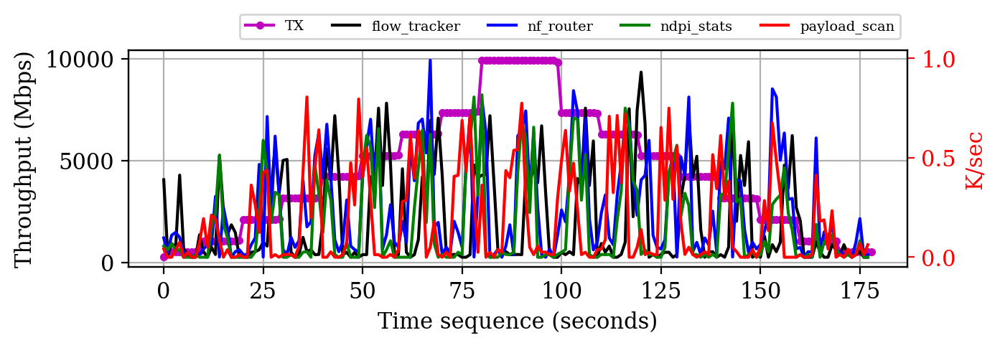

In [224]:
plot_feature("node-stores", "K/sec", 7)

## Resource stimulus experiments

### Case 1: stress-testing the Flow_tracker

In [37]:
from IPython.display import IFrame
IFrame("./case2.pdf", width=600, height=420)

In [239]:
exp_rs = "exp-5-3-4"

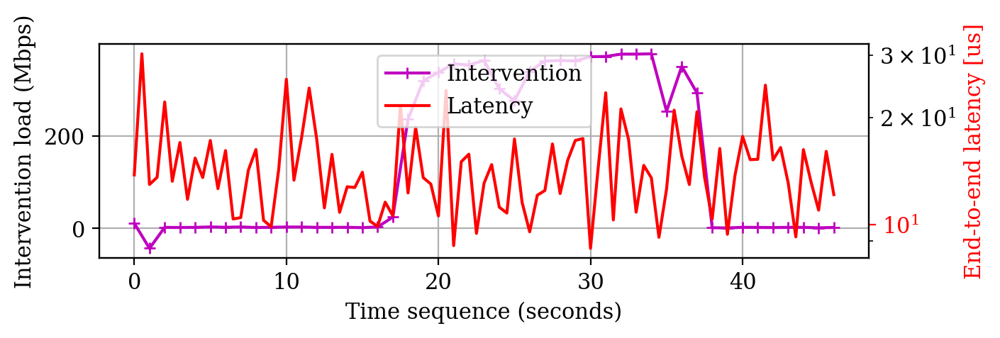

In [241]:
fig, ax = plt.subplots(figsize = (7,2))
ax.grid(True)
ax.set_xlabel("Time sequence (seconds)")
ax.set_ylabel("Intervention load (Mbps)")

ax2 = ax.twinx()
ax2.tick_params(axis='y', colors='red')
ax2.set_ylabel("End-to-end latency [us]", color="red")

tx = np.asarray(parse_seq("resource_stimulus", exp_rs, "tx_stats.csv"))
rx = np.asarray(parse_seq("resource_stimulus", exp_rs, "rx_stats.csv"))

diff = tx-rx

l = ax.plot(diff, marker=next(marker), color=next(cycol), label="Intervention")
lat = parse_seq("resource_stimulus", exp_rs, "latency.csv")
ax2.set_yscale("log")
l2 = ax2.plot(0.5*np.arange(0, len(lat)), lat, color="red", label="Latency")

lns = l+l2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs)

In [40]:
def plot_feature_rs(feature, label, index=1):
    fig, ax, ax2 = init_plt(label)
    tx = np.asarray(parse_seq("resource_stimulus", exp_rs, "tx_stats.csv"))
    rx = np.asarray(parse_seq("resource_stimulus", exp_rs, "rx_stats.csv"))

    lns = ax.plot(tx-rx, marker=next(marker), color=next(cycol), label="Intervention")

    for v in vnfs:
        data = parse_reg("resource_stimulus", exp_rs, v, feature, index)
        lns += ax2.plot(data, color=next(cycol), label=v.split(".")[0])

    labs = [l.get_label() for l in lns]
    plt.legend(lns, labs, loc=1, bbox_to_anchor=(1, 1.2), ncol=6, prop={'size': 7})

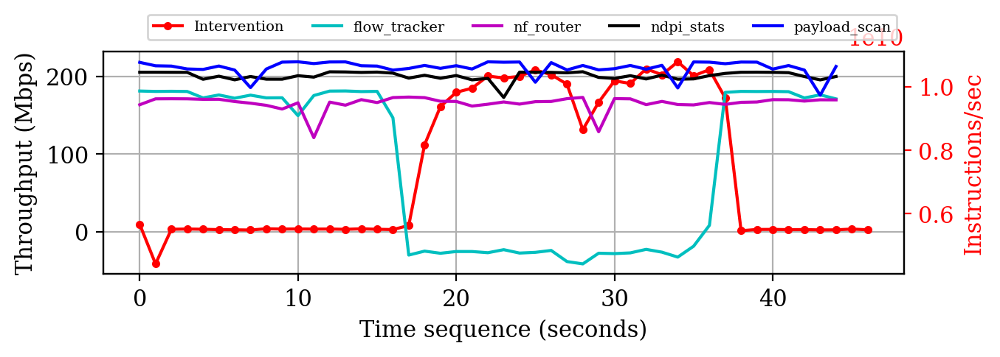

In [41]:
plot_feature_rs("instructions,", "Instructions/sec")

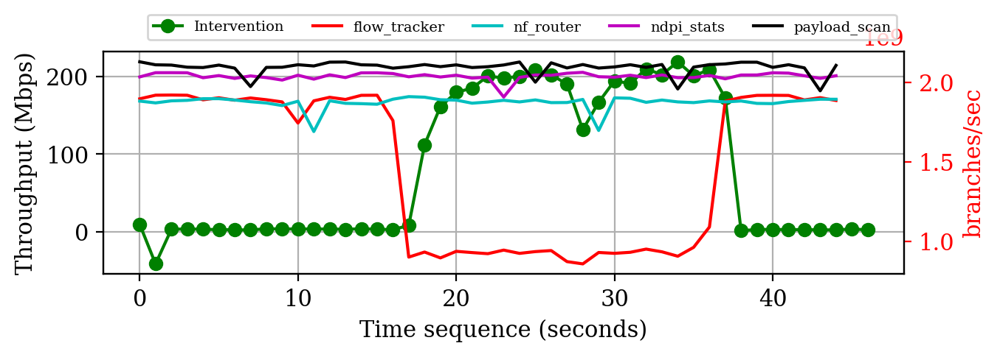

In [42]:
plot_feature_rs("branches,", "branches/sec",)

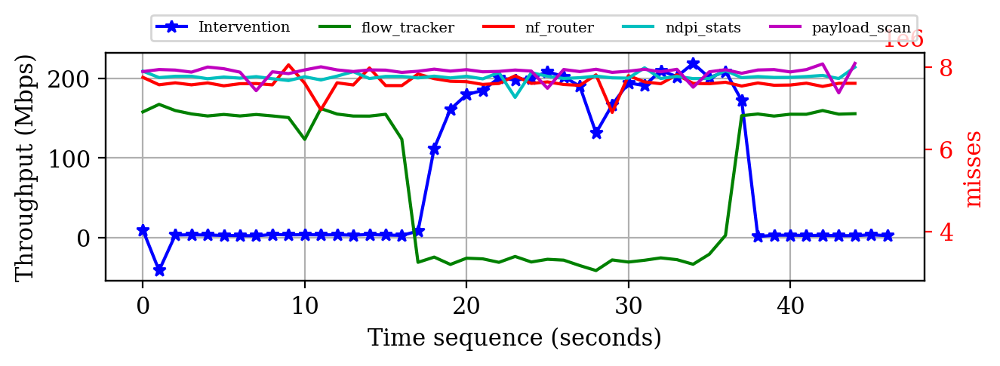

In [43]:
plot_feature_rs("branch-misses", "misses")

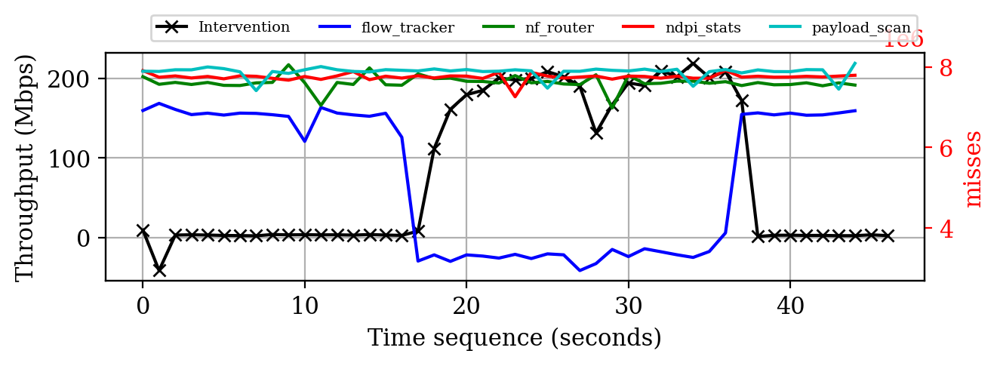

In [44]:
plot_feature_rs("branch-load-misses", "misses")

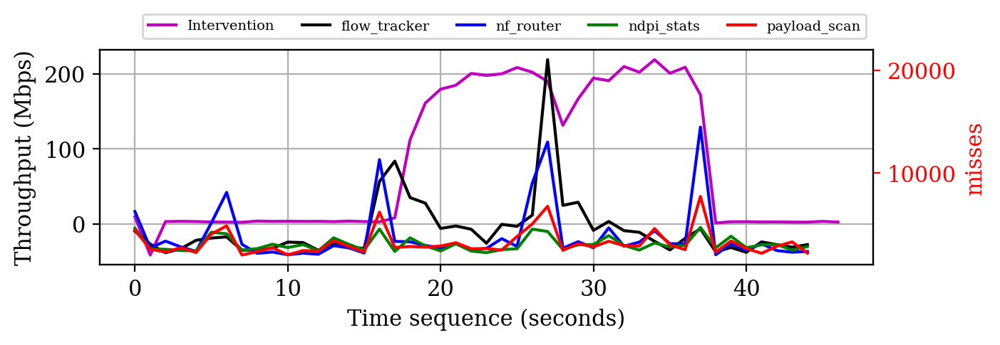

In [45]:
plot_feature_rs("cache-misses", "misses")

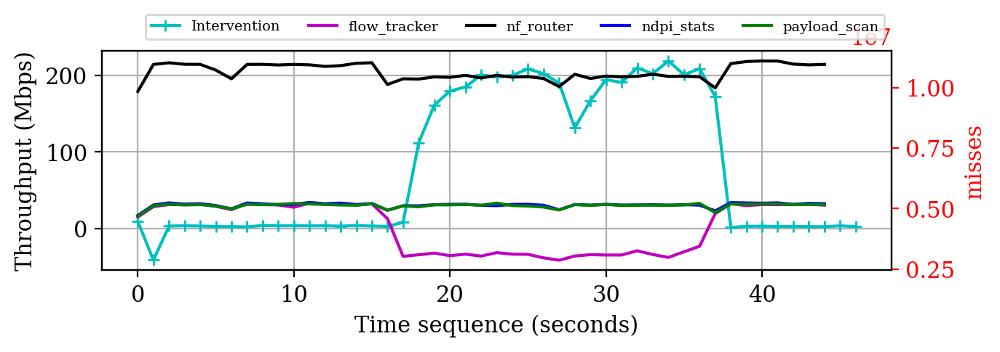

In [46]:
plot_feature_rs("cache-references", "misses")

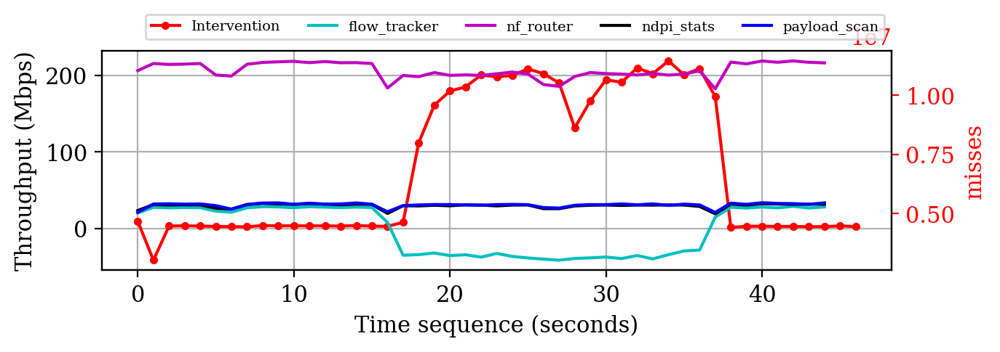

In [47]:
plot_feature_rs("L1-dcache-load-misses", "misses", )

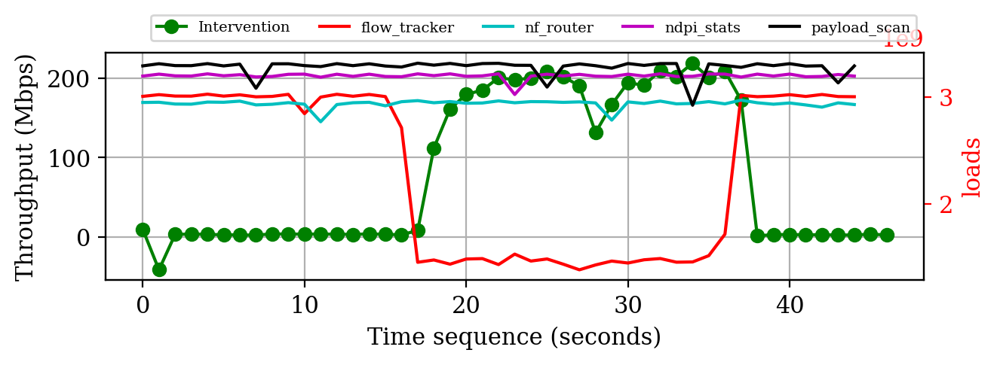

In [48]:
plot_feature_rs("L1-dcache-loads", "loads", )

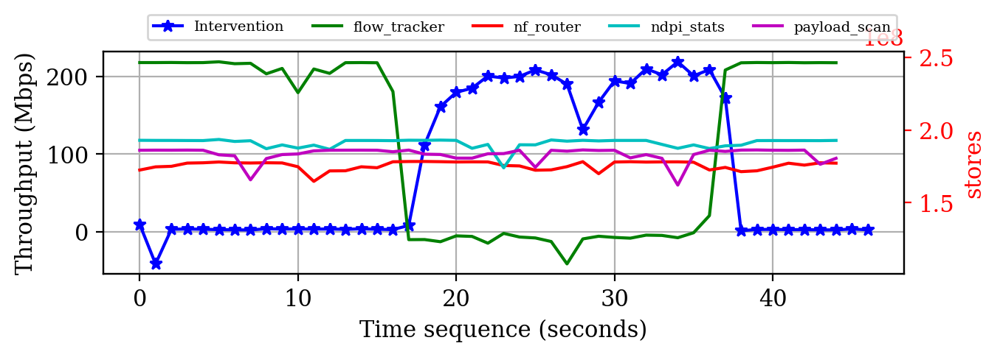

In [49]:
plot_feature_rs("L1-dcache-stores", "stores", )

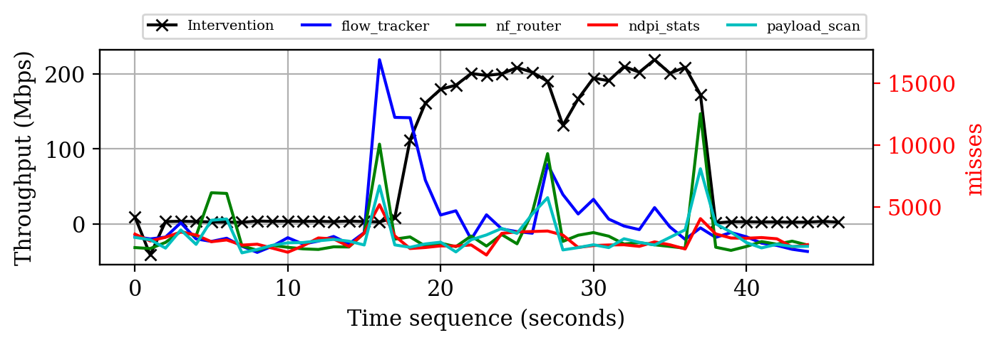

In [50]:
plot_feature_rs("LLC-load-misses", "misses", )

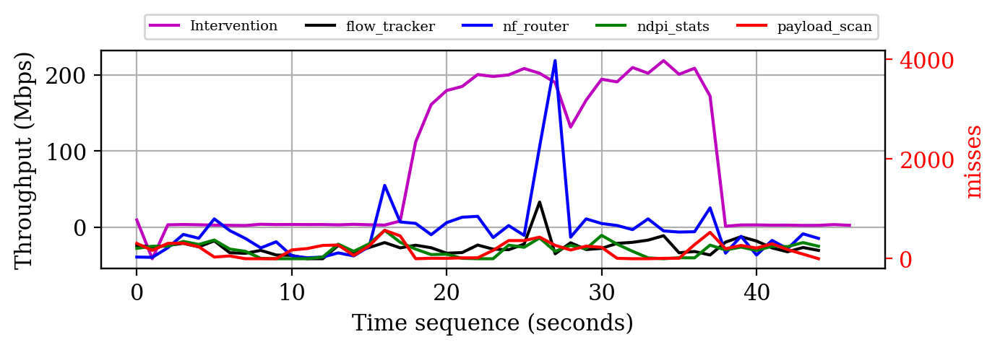

In [51]:
plot_feature_rs("LLC-store-misses", "misses", )

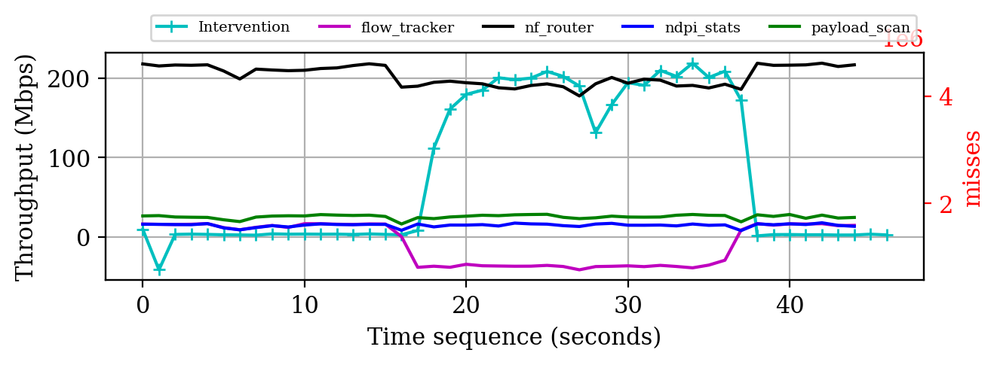

In [52]:
plot_feature_rs("LLC-stores", "misses", )

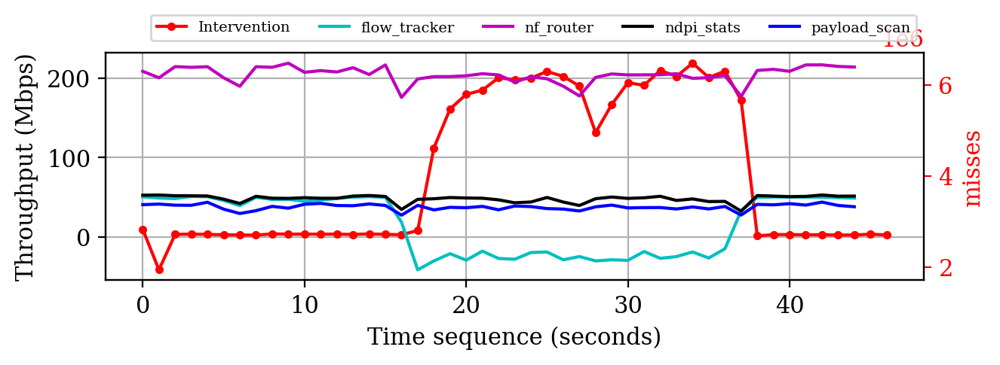

In [53]:
plot_feature_rs("LLC-loads", "misses", )

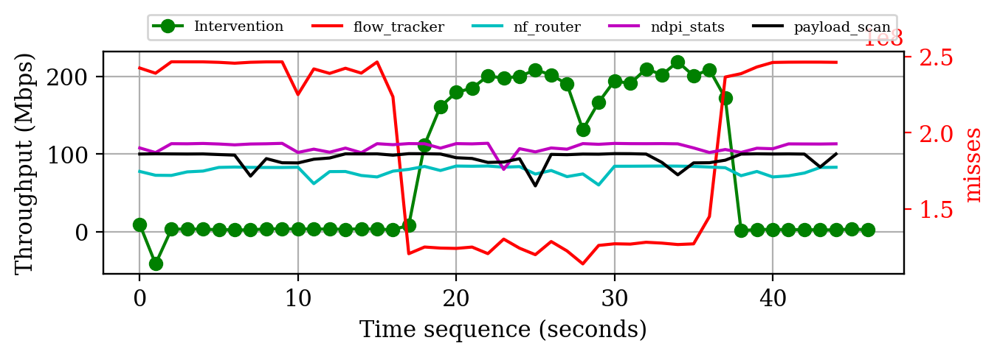

In [54]:
plot_feature_rs("dTLB-stores", "misses", )

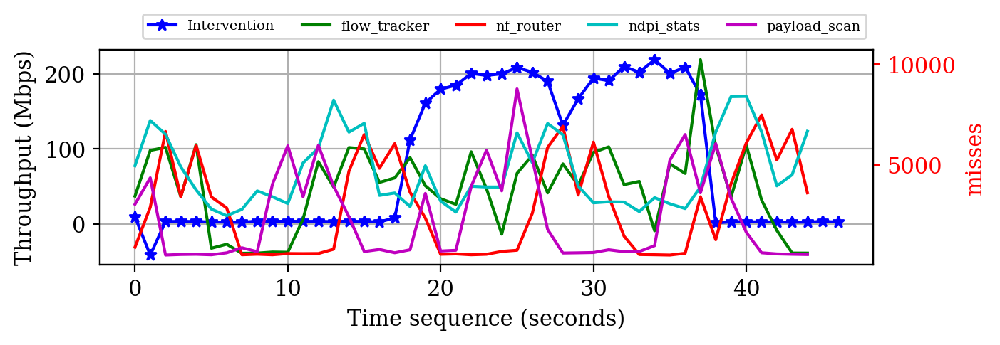

In [55]:
plot_feature_rs("dTLB-load-misses", "misses", )

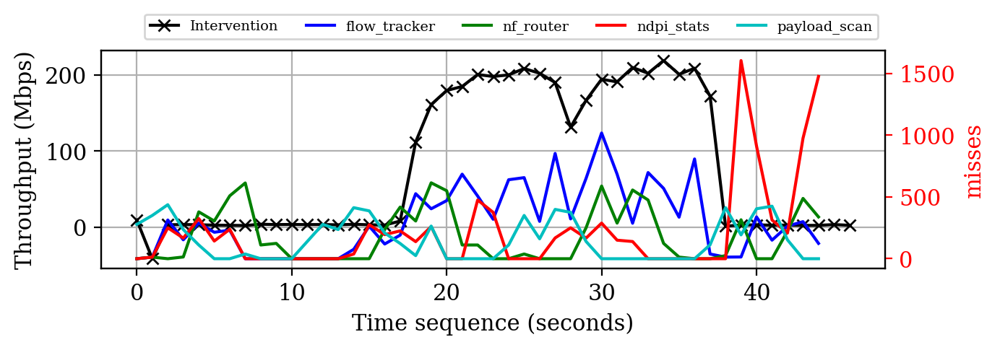

In [56]:
plot_feature_rs("dTLB-store-misses", "misses", )

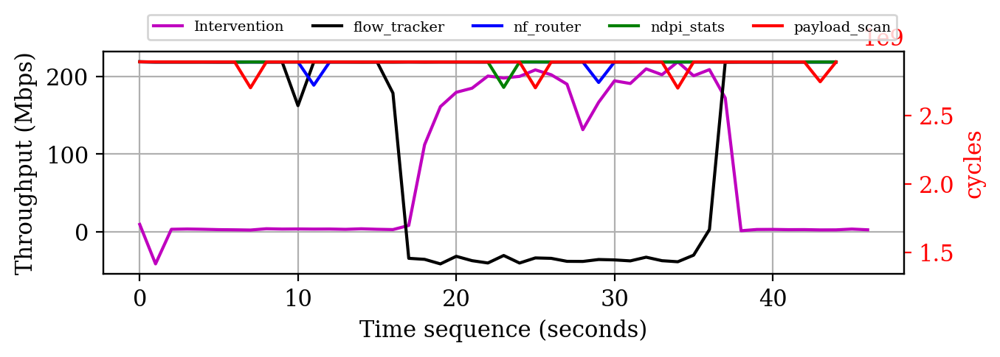

In [57]:
plot_feature_rs(",cycles", "cycles",)

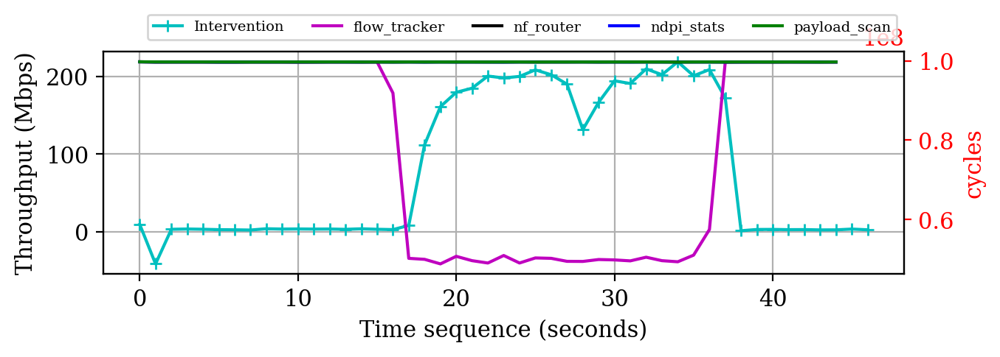

In [58]:
plot_feature_rs("bus-cycles", "cycles",)

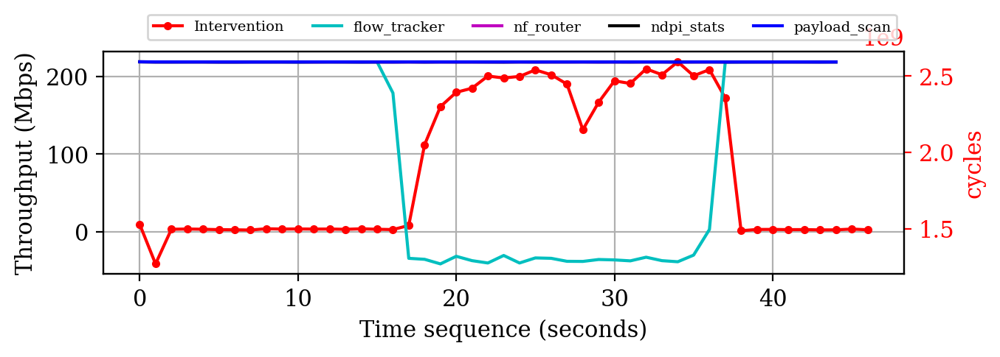

In [59]:
plot_feature_rs("ref-cycles", "cycles", )

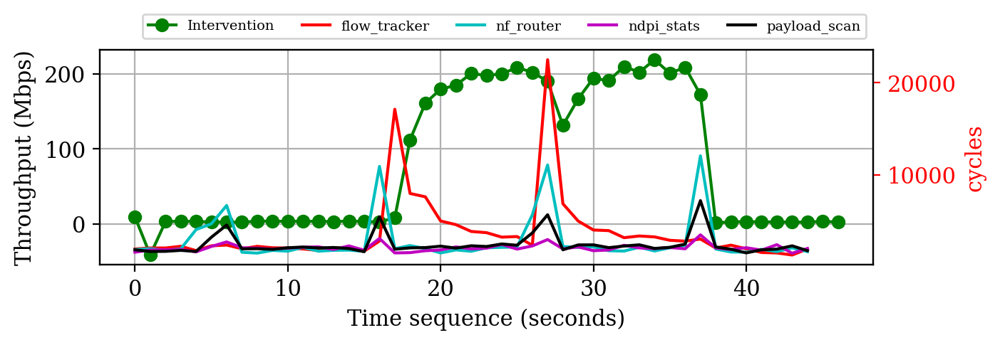

In [60]:
plot_feature_rs("node-loads", "cycles", )

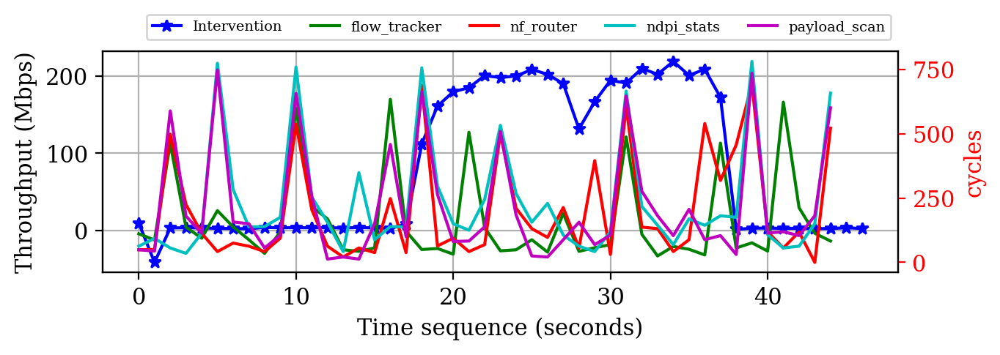

In [61]:
plot_feature_rs("node-load-misses", "cycles", )

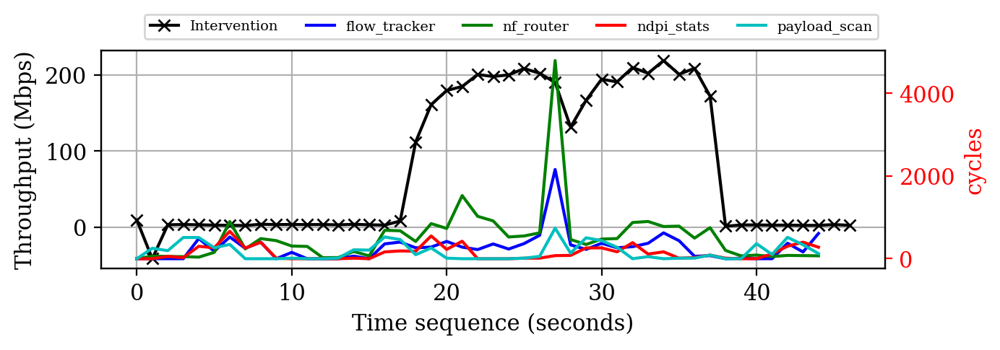

In [62]:
plot_feature_rs("node-stores", "cycles", )

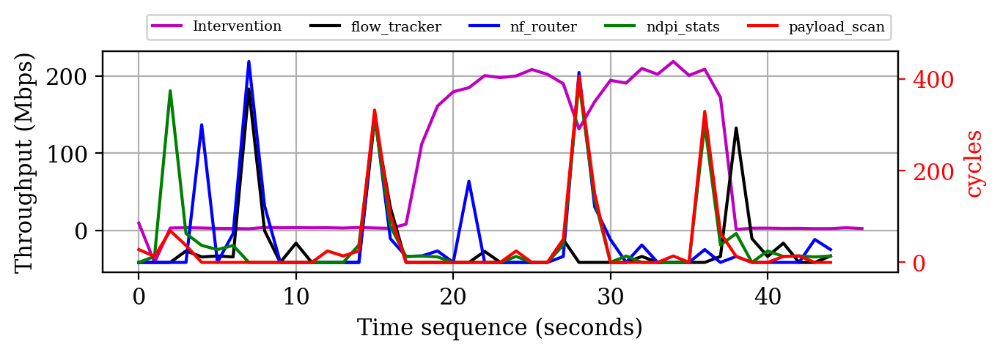

In [63]:
plot_feature_rs("node-store-misses", "cycles", )

### Case 2: 

In [64]:
from IPython.display import IFrame
IFrame("./case1.pdf", width=600, height=420)

In [65]:
exp_rs = "exp-6-1-3"

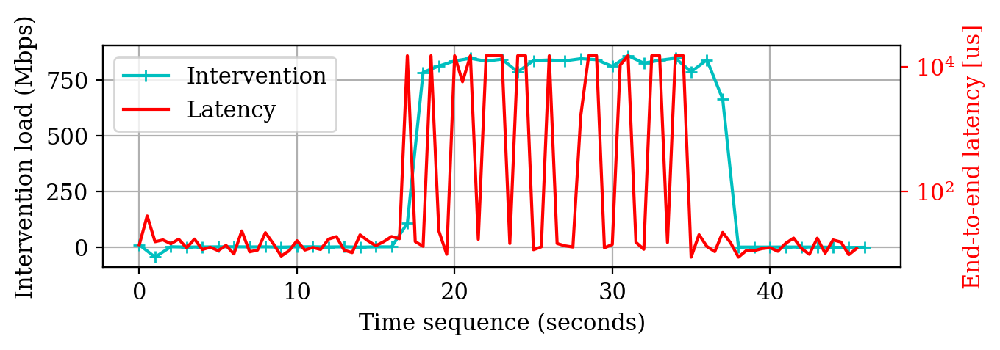

In [66]:
fig, ax = plt.subplots(figsize = (7,2))
ax.grid(True)
ax.set_xlabel("Time sequence (seconds)")
ax.set_ylabel("Intervention load (Mbps)")

ax2 = ax.twinx()
ax2.tick_params(axis='y', colors='red')
ax2.set_ylabel("End-to-end latency [us]", color="red")

tx = np.asarray(parse_seq("resource_stimulus", exp_rs, "tx_stats.csv"))
rx = np.asarray(parse_seq("resource_stimulus", exp_rs, "rx_stats.csv"))

diff = tx-rx

l = ax.plot(diff, marker=next(marker), color=next(cycol), label="Intervention")
lat = parse_seq("resource_stimulus", exp_rs, "latency.csv")
ax2.set_yscale("log")
l2 = ax2.plot(0.5*np.arange(0, len(lat)), lat, color="red", label="Latency")

lns = l+l2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs)

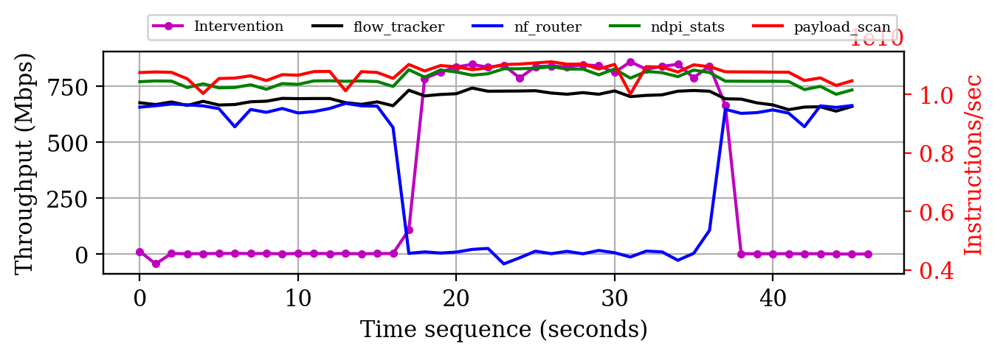

In [67]:
plot_feature_rs("instructions,", "Instructions/sec")

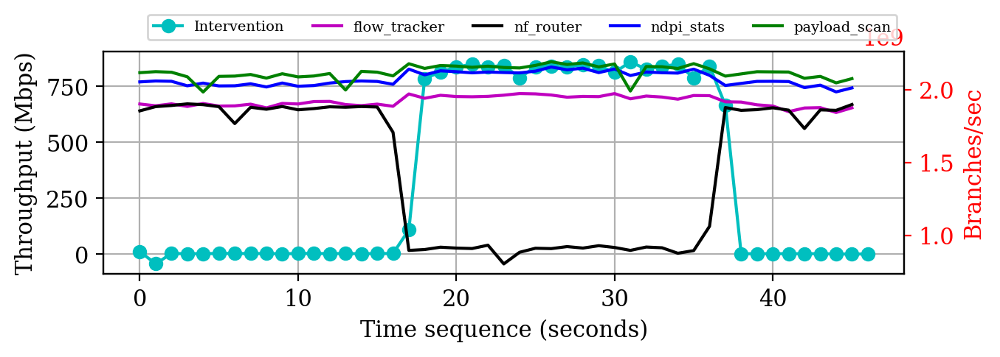

In [68]:
plot_feature_rs("branches,", "Branches/sec")

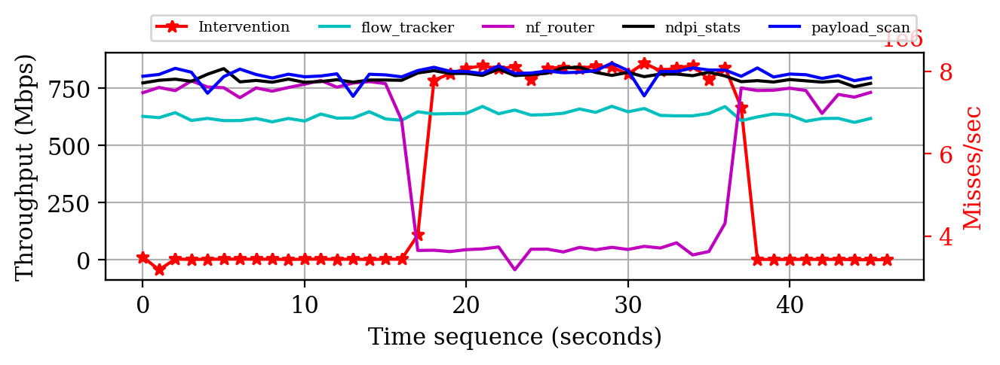

In [69]:
plot_feature_rs("branch-misses,", "Misses/sec")

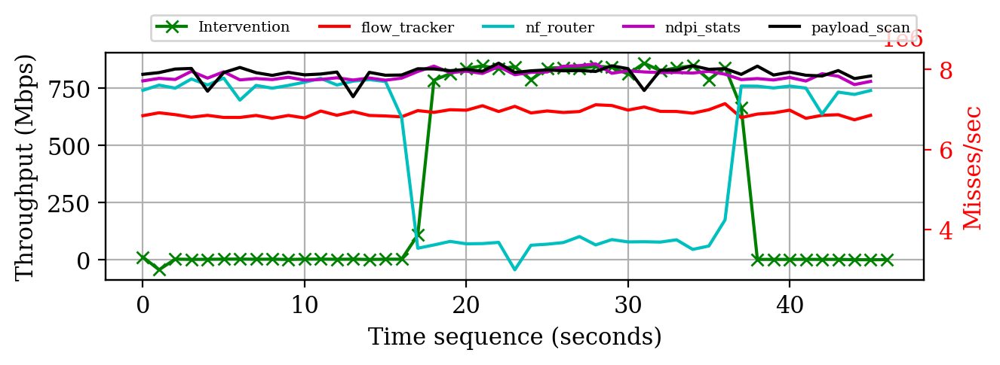

In [70]:
plot_feature_rs("branch-load-misses,", "Misses/sec")

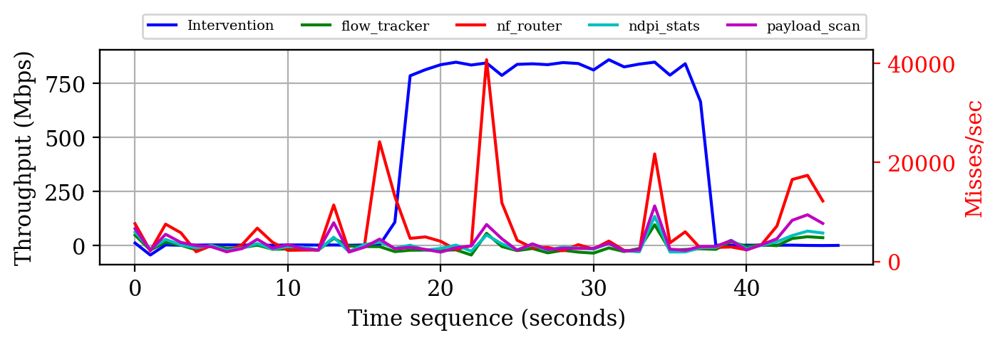

In [71]:
plot_feature_rs("cache-misses,", "Misses/sec")

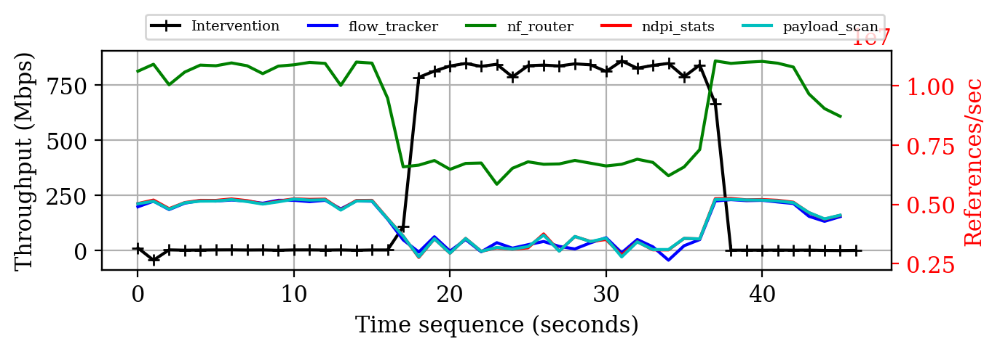

In [72]:
plot_feature_rs("cache-references,", "References/sec")

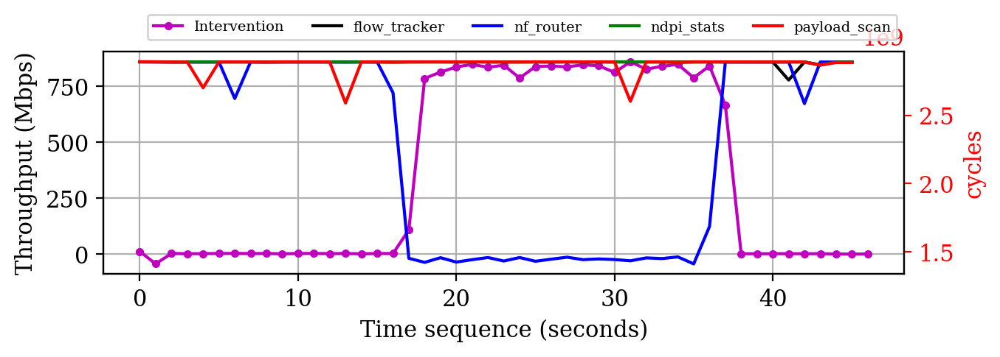

In [73]:
plot_feature_rs(",cycles,", "cycles")

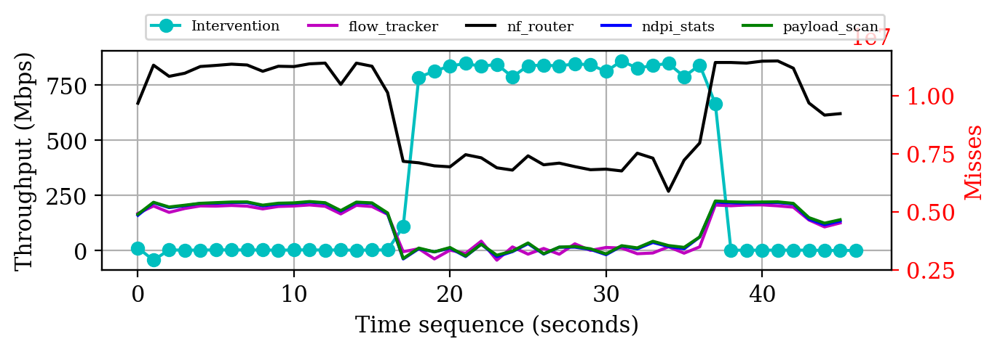

In [74]:
plot_feature_rs(",L1-dcache-load-misses,", "Misses")

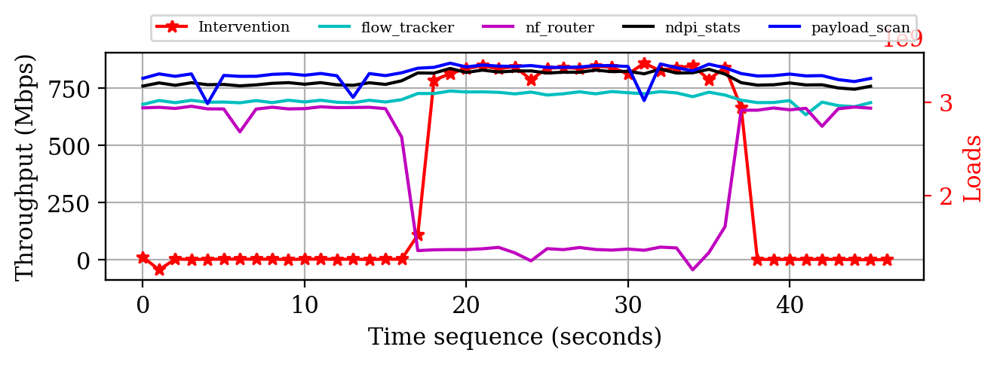

In [75]:
plot_feature_rs("L1-dcache-loads", "Loads")

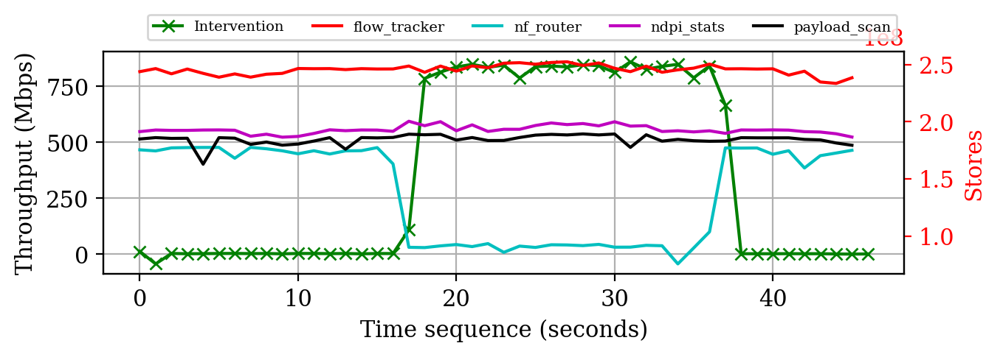

In [76]:
plot_feature_rs("L1-dcache-stores", "Stores")

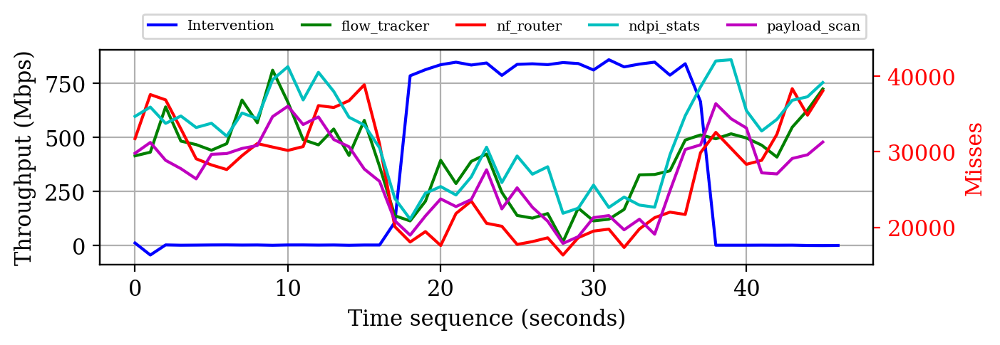

In [77]:
plot_feature_rs("L1-icache-load-misses", "Misses")

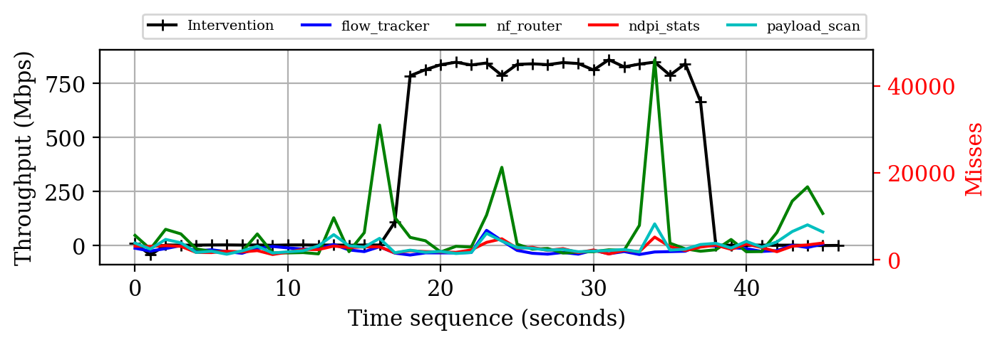

In [78]:
plot_feature_rs("LLC-load-misses", "Misses")

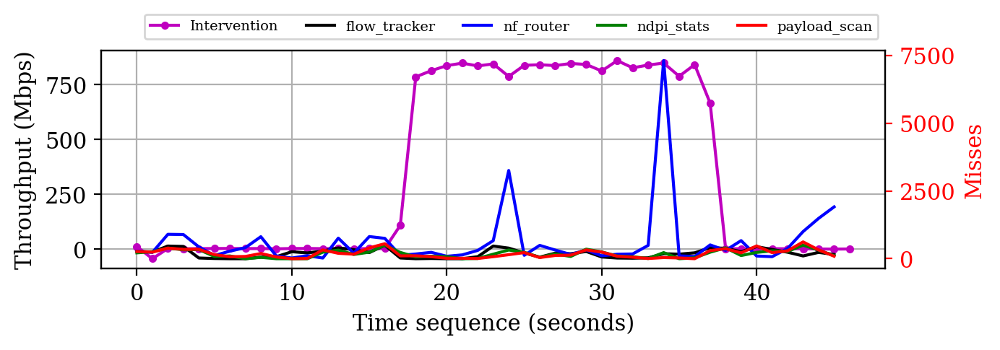

In [79]:
plot_feature_rs("LLC-store-misses", "Misses")

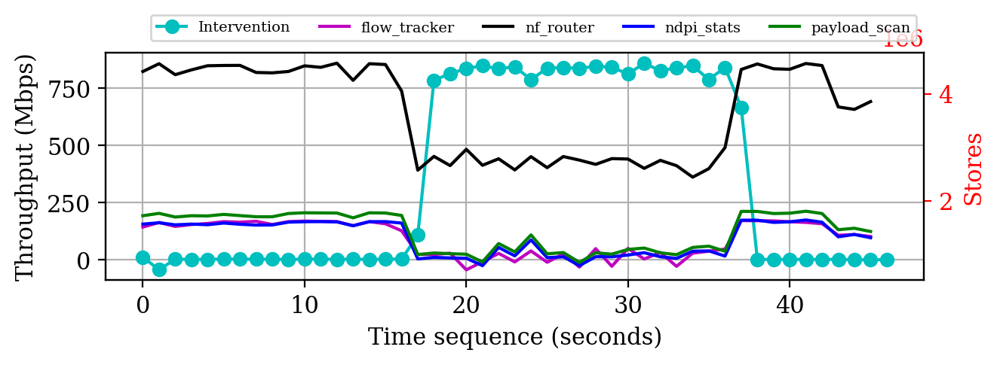

In [80]:
plot_feature_rs("LLC-stores", "Stores")

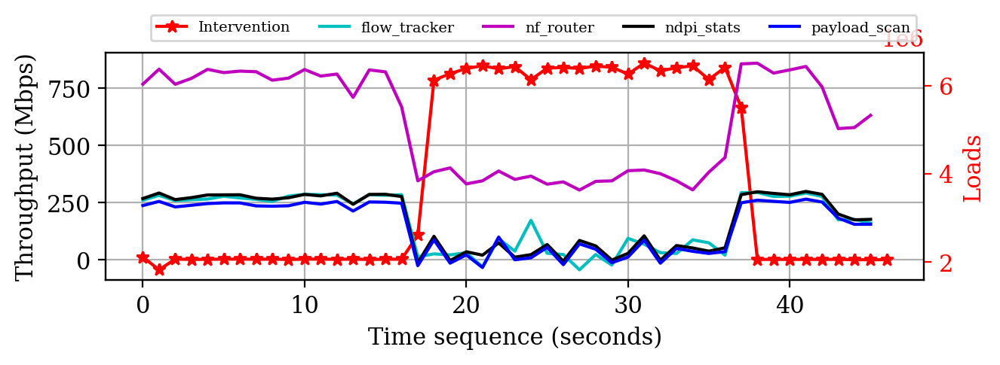

In [81]:
plot_feature_rs("LLC-loads", "Loads")

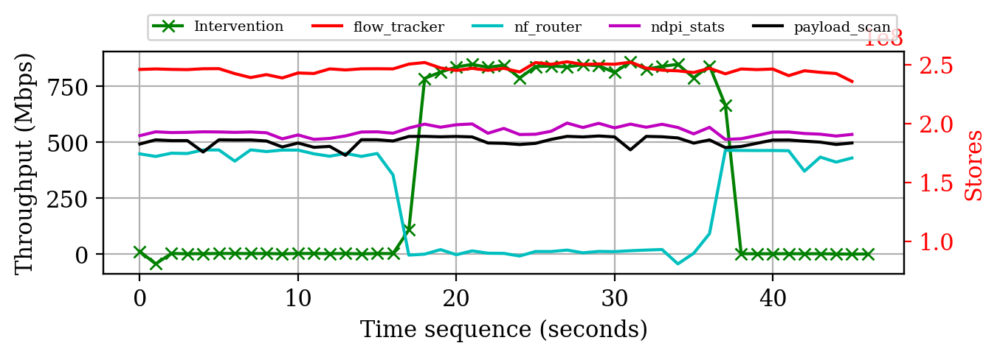

In [82]:
plot_feature_rs("dTLB-stores", "Stores")

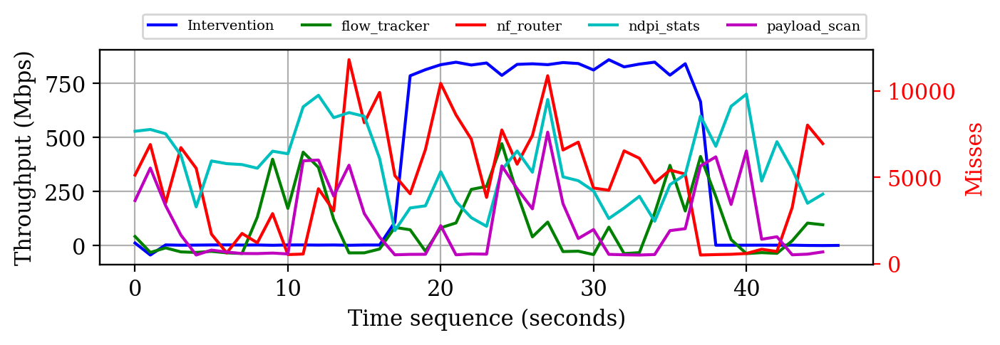

In [83]:
plot_feature_rs("dTLB-load-misses", "Misses")

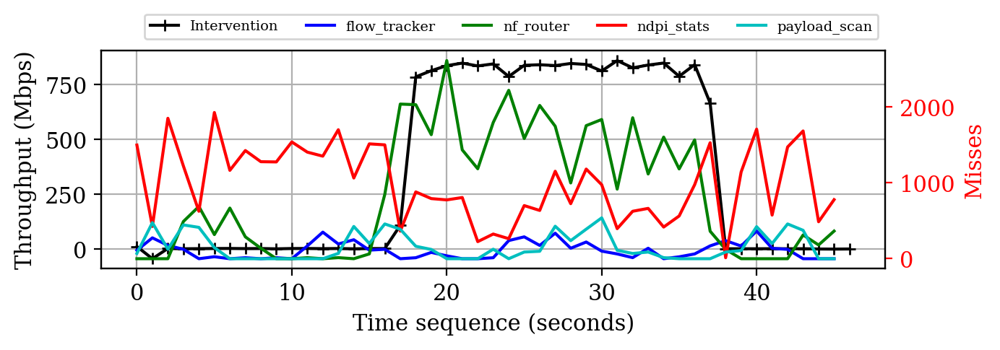

In [84]:
plot_feature_rs("dTLB-store-misses", "Misses")

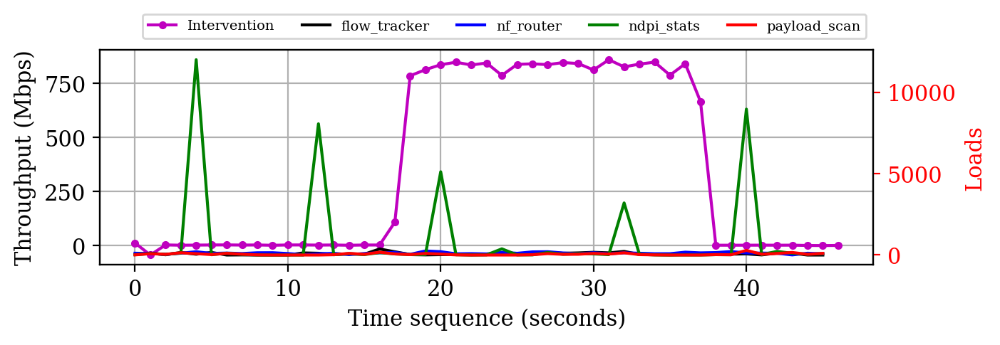

In [85]:
plot_feature_rs("iTLB-loads", "Loads")

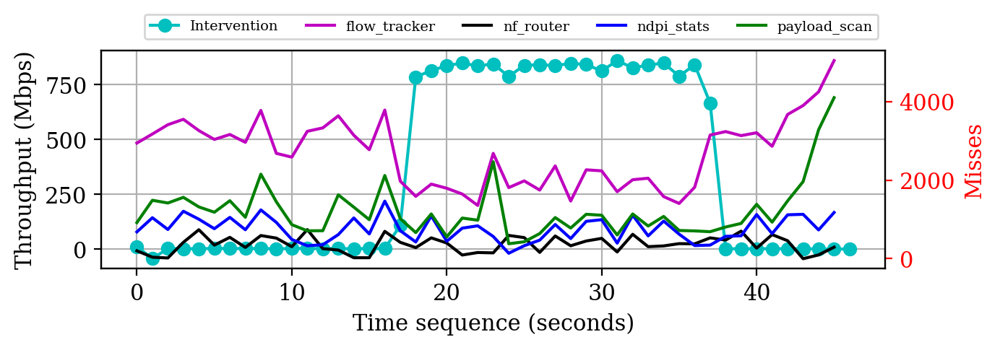

In [86]:
plot_feature_rs("iTLB-load-misses", "Misses")

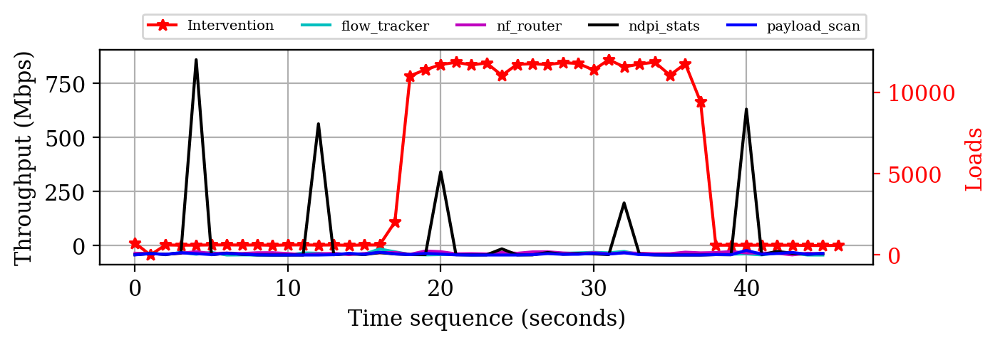

In [87]:
plot_feature_rs("iTLB-loads", "Loads")

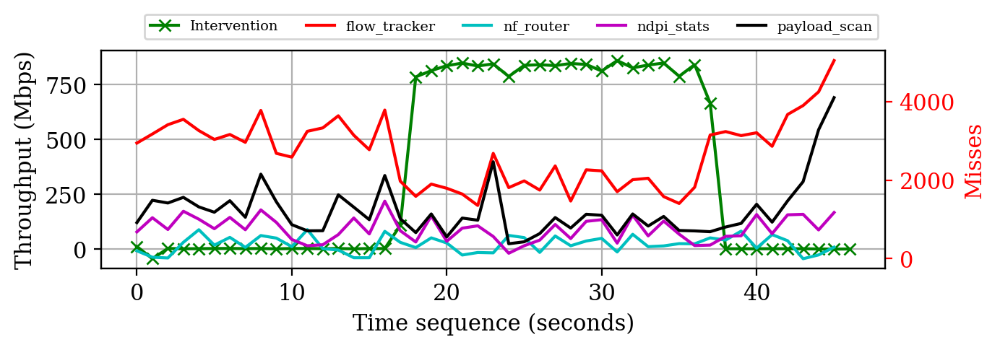

In [88]:
plot_feature_rs("iTLB-load-misses", "Misses")

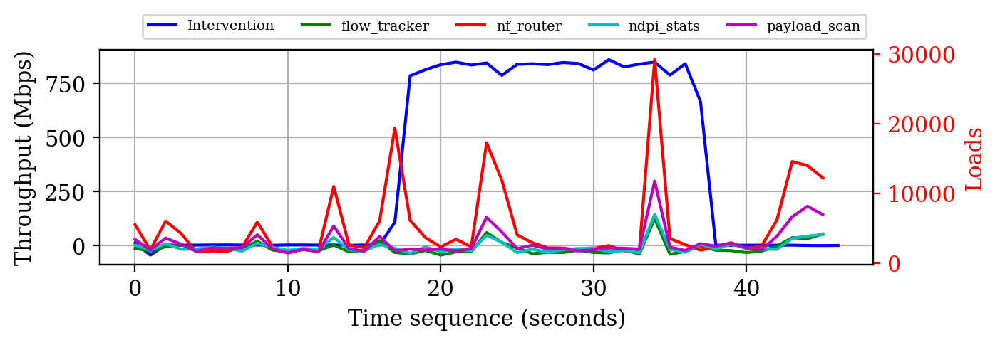

In [89]:
plot_feature_rs("node-loads", "Loads")

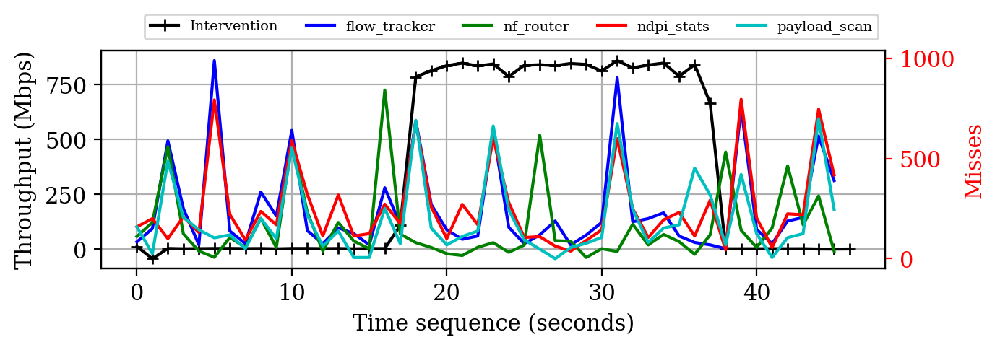

In [90]:
plot_feature_rs("node-load-misses", "Misses")

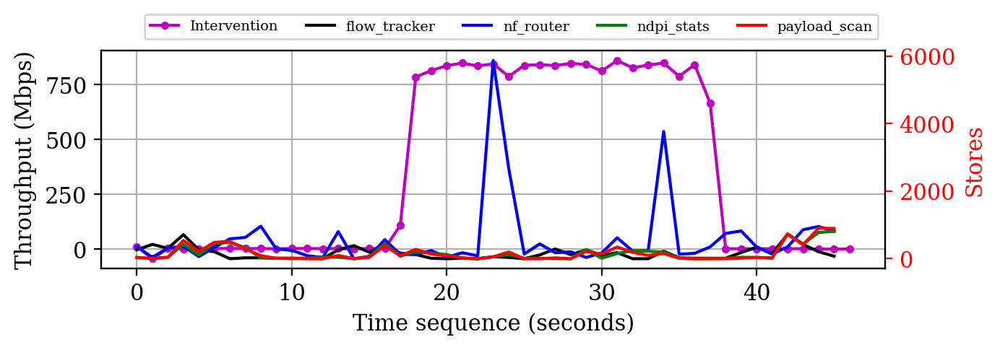

In [91]:
plot_feature_rs("node-stores", "Stores")

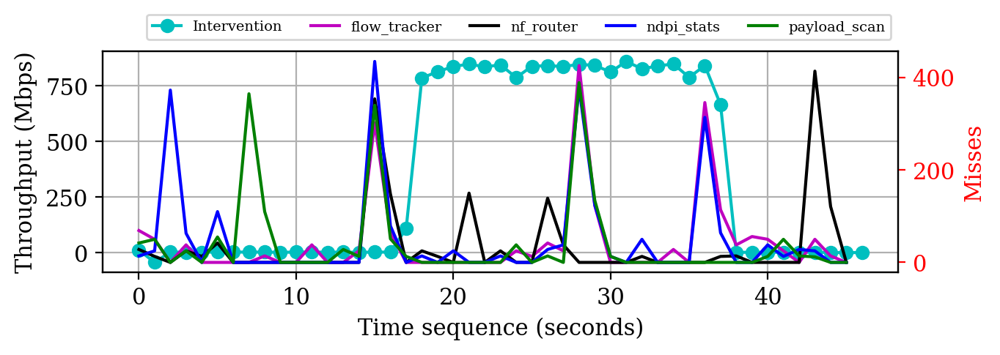

In [92]:
plot_feature_rs("node-store-misses", "Misses")

### Case 3: stress-testing the Payload_scan

In [93]:
from IPython.display import IFrame
IFrame("./case3.pdf", width=600, height=420)

In [94]:
exp_rs = "exp-8-1-2"

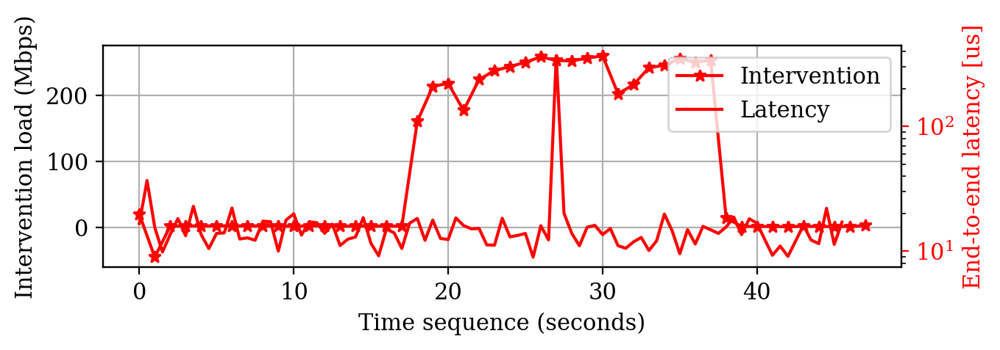

In [95]:
fig, ax = plt.subplots(figsize = (7,2))
ax.grid(True)
ax.set_xlabel("Time sequence (seconds)")
ax.set_ylabel("Intervention load (Mbps)")

ax2 = ax.twinx()
ax2.tick_params(axis='y', colors='red')
ax2.set_ylabel("End-to-end latency [us]", color="red")

tx = np.asarray(parse_seq("resource_stimulus", exp_rs, "tx_stats.csv"))
rx = np.asarray(parse_seq("resource_stimulus", exp_rs, "rx_stats.csv"))

diff = tx-rx

l = ax.plot(diff, marker=next(marker), color=next(cycol), label="Intervention")
lat = parse_seq("resource_stimulus", exp_rs, "latency.csv")
ax2.set_yscale("log")
l2 = ax2.plot(0.5*np.arange(0, len(lat)), lat, color="red", label="Latency")

lns = l+l2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs)

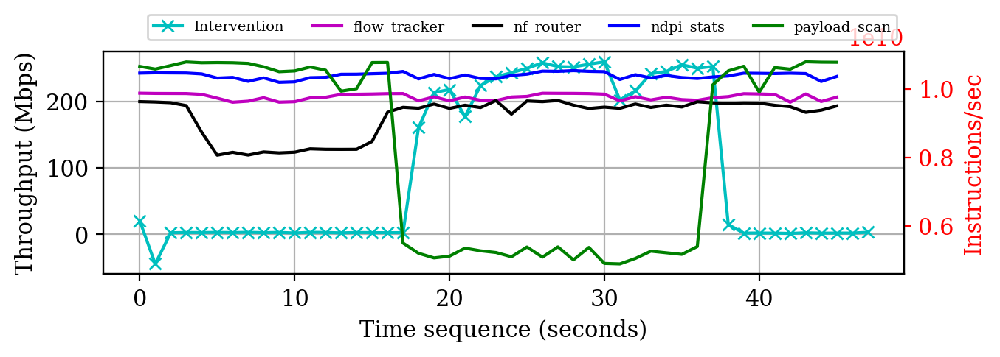

In [96]:
plot_feature_rs("instructions,", "Instructions/sec")

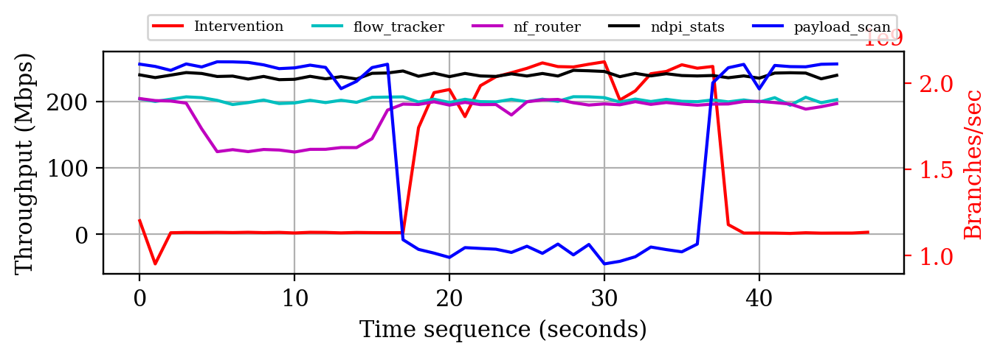

In [97]:
plot_feature_rs("branches,", "Branches/sec")

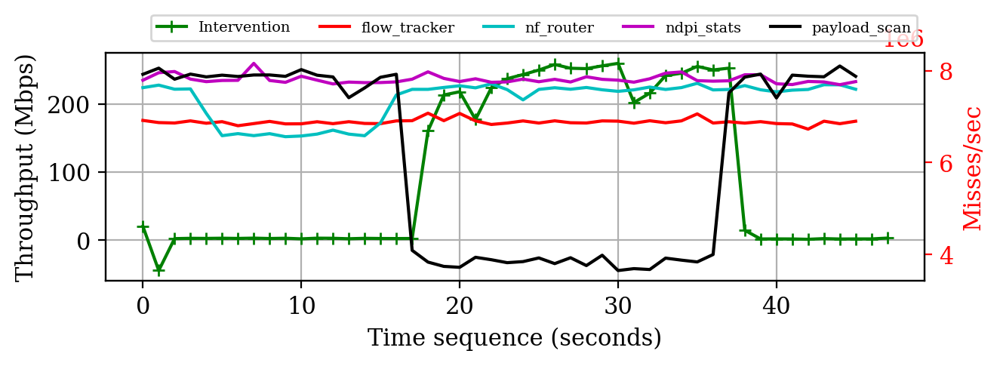

In [98]:
plot_feature_rs("branch-misses,", "Misses/sec")

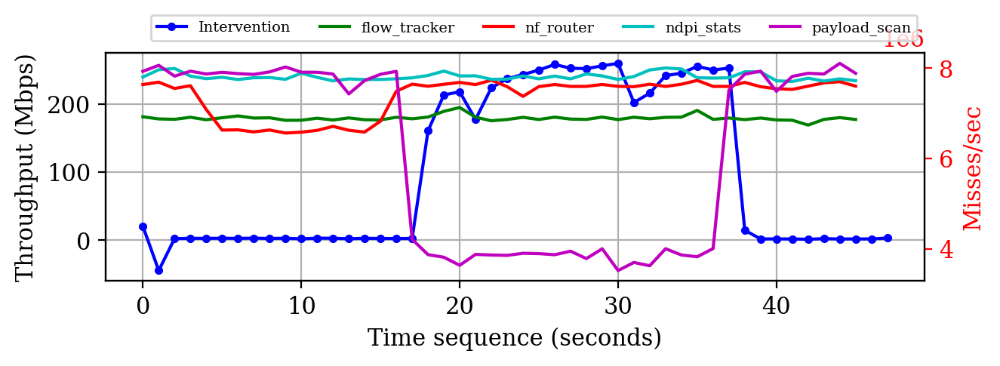

In [99]:
plot_feature_rs("branch-load-misses,", "Misses/sec")

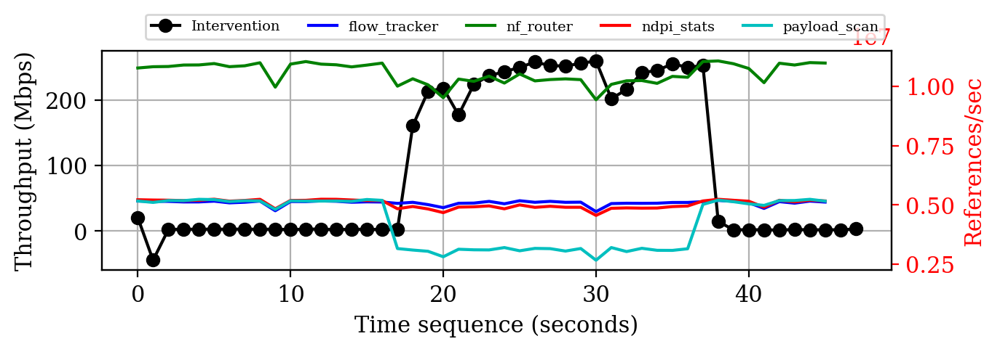

In [100]:
plot_feature_rs("cache-references", "References/sec")

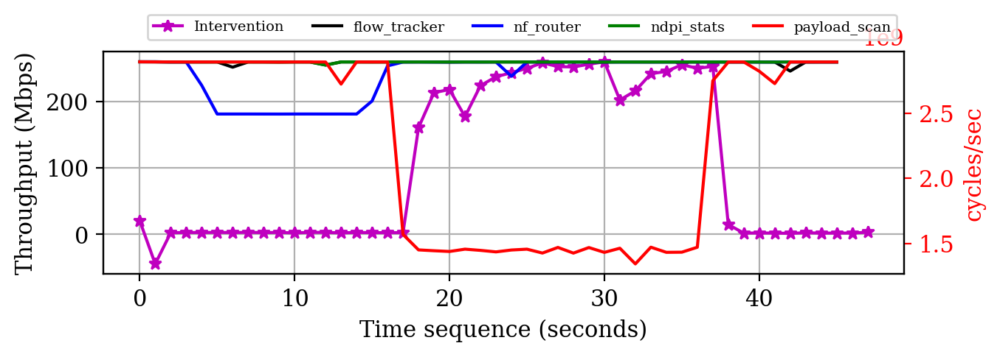

In [101]:
plot_feature_rs(",cycles", "cycles/sec")

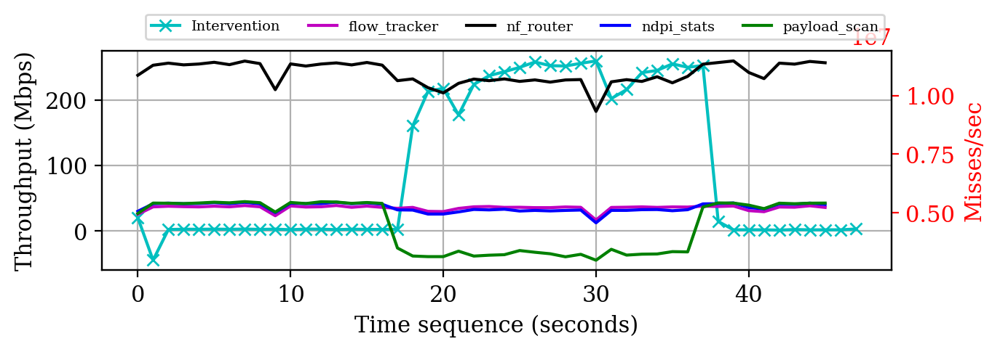

In [102]:
plot_feature_rs("L1-dcache-load-misses", "Misses/sec")

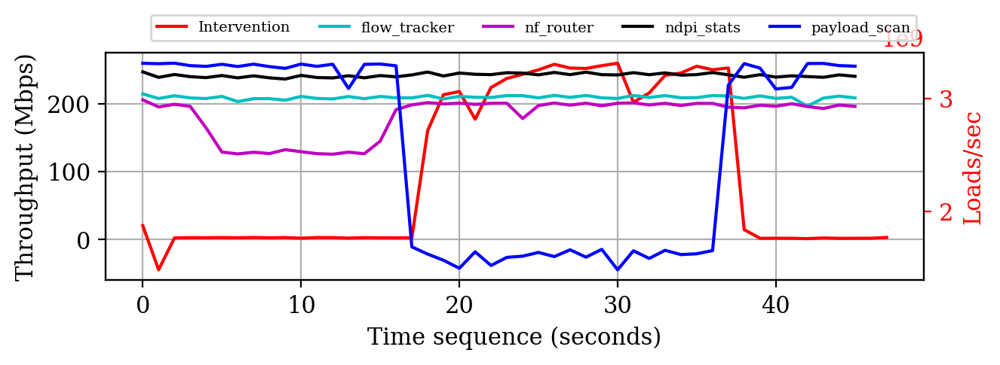

In [103]:
plot_feature_rs("L1-dcache-loads", "Loads/sec")

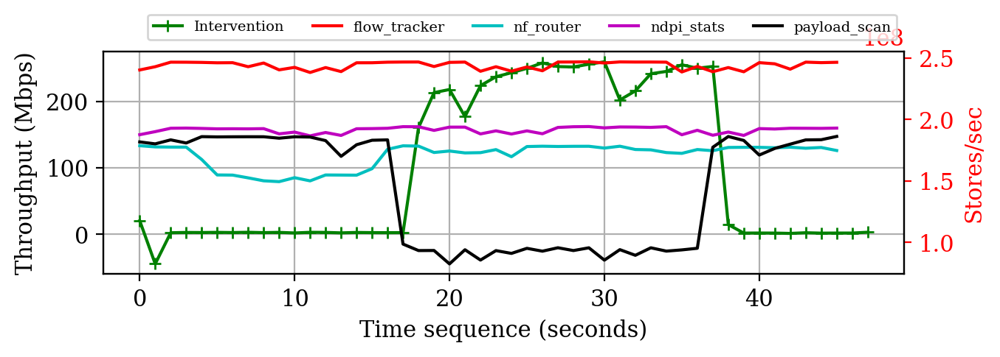

In [104]:
plot_feature_rs("L1-dcache-stores", "Stores/sec")

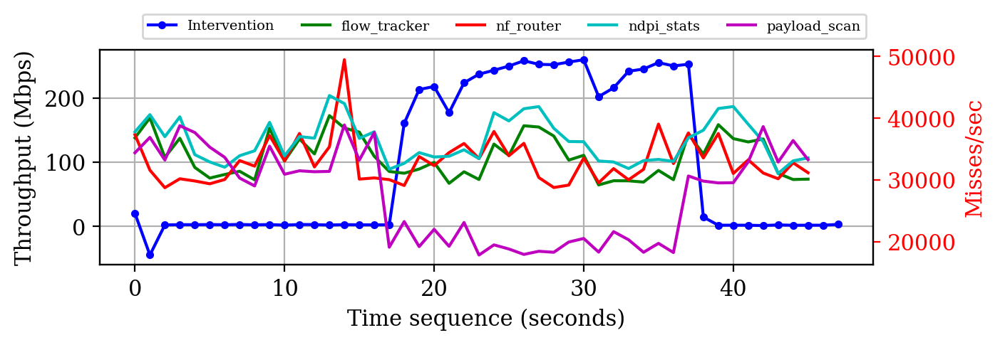

In [105]:
plot_feature_rs("L1-icache-load-misses", "Misses/sec")

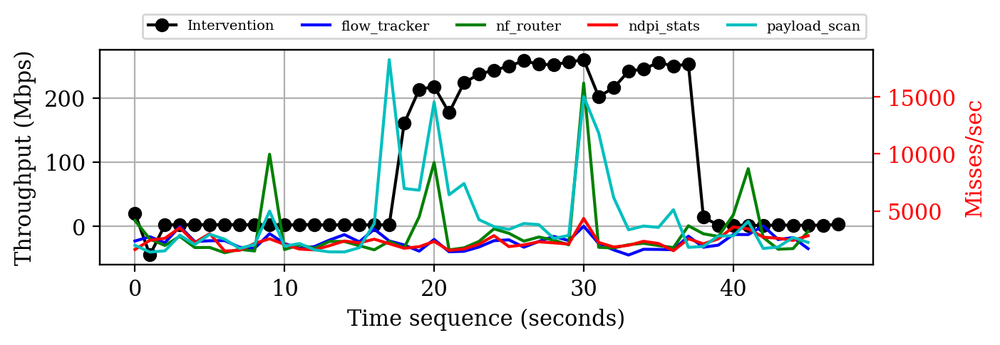

In [106]:
plot_feature_rs("LLC-load-misses", "Misses/sec")

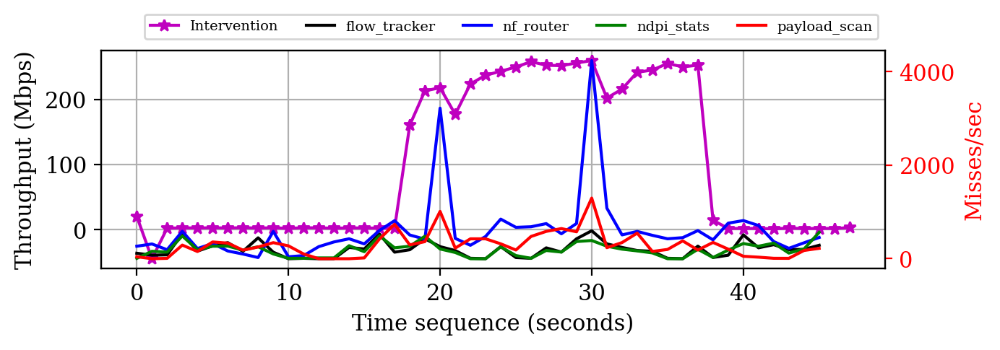

In [107]:
plot_feature_rs("LLC-store-misses", "Misses/sec")

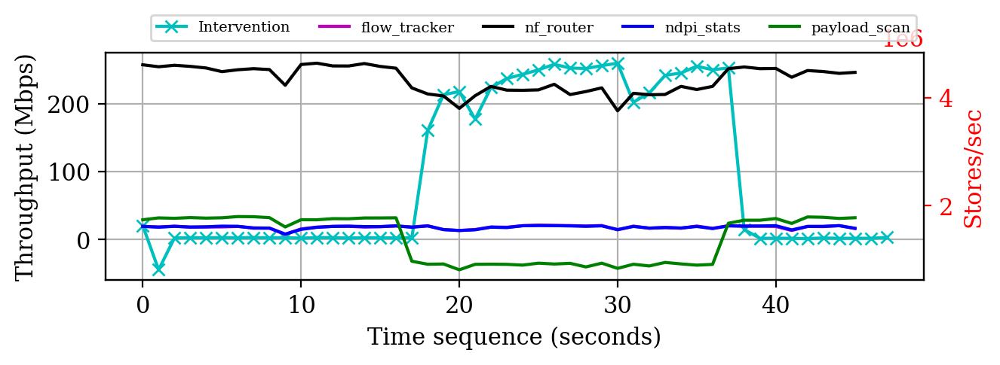

In [108]:
plot_feature_rs("LLC-stores", "Stores/sec")

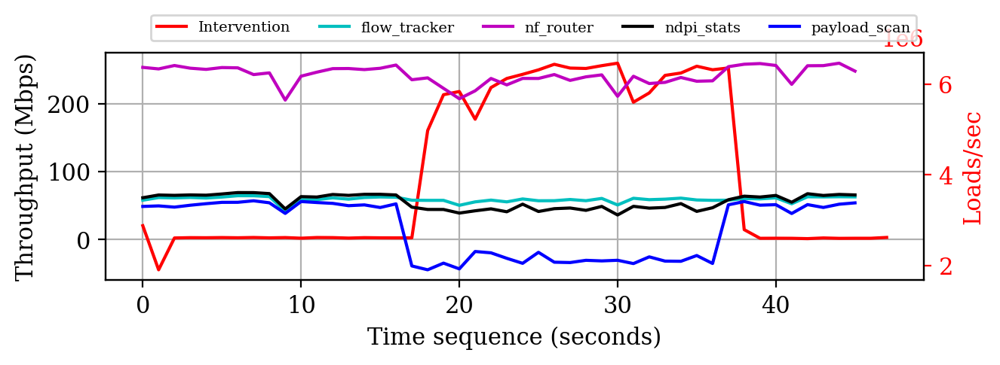

In [109]:
plot_feature_rs("LLC-loads", "Loads/sec")

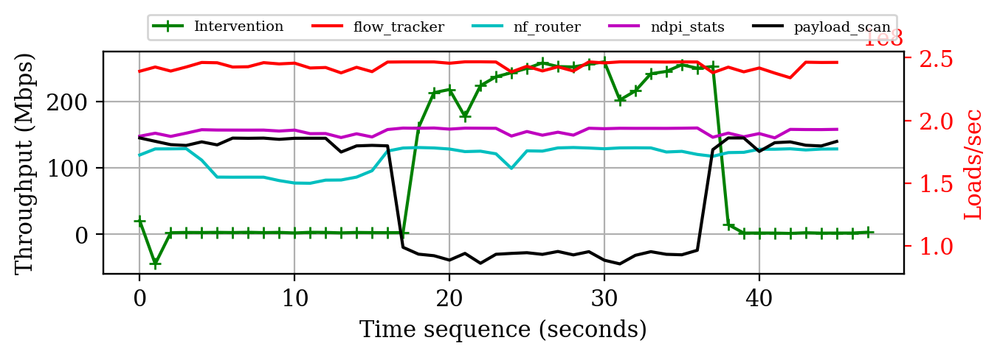

In [110]:
plot_feature_rs("dTLB-stores", "Loads/sec")

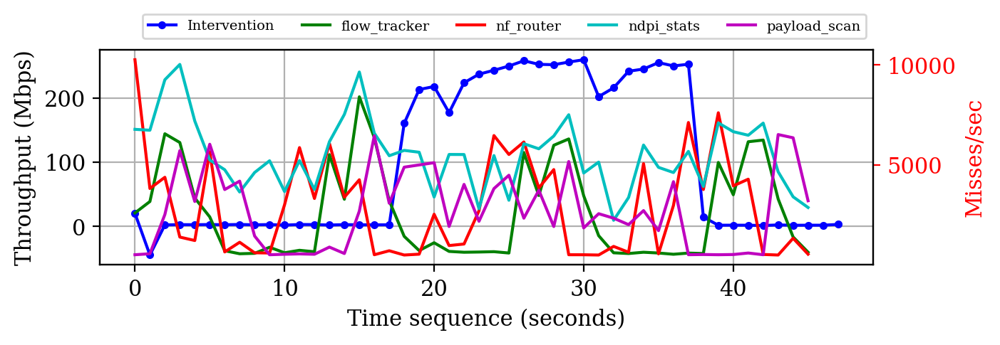

In [111]:
plot_feature_rs("dTLB-load-misses", "Misses/sec")

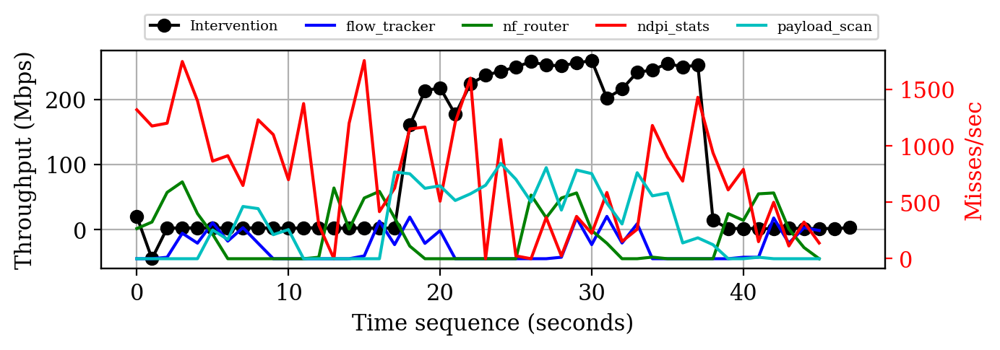

In [112]:
plot_feature_rs("dTLB-store-misses", "Misses/sec")

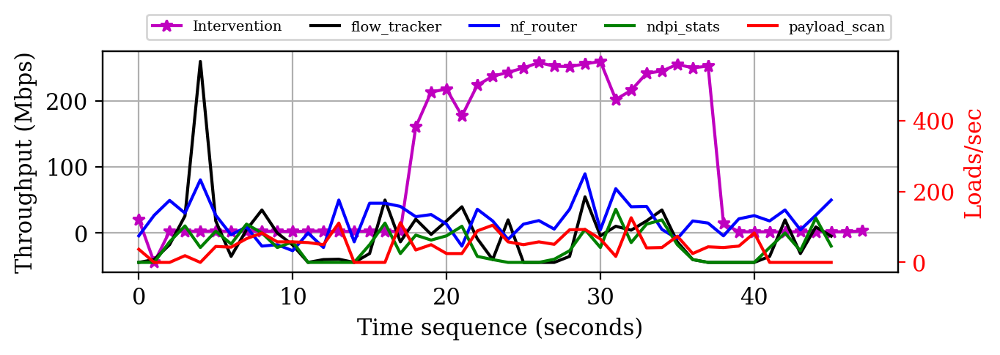

In [113]:
plot_feature_rs("iTLB-loads", "Loads/sec")

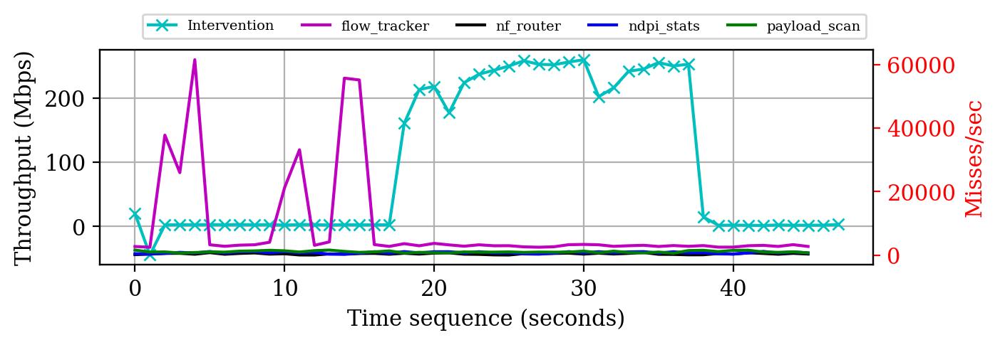

In [114]:
plot_feature_rs("iTLB-load-misses", "Misses/sec")

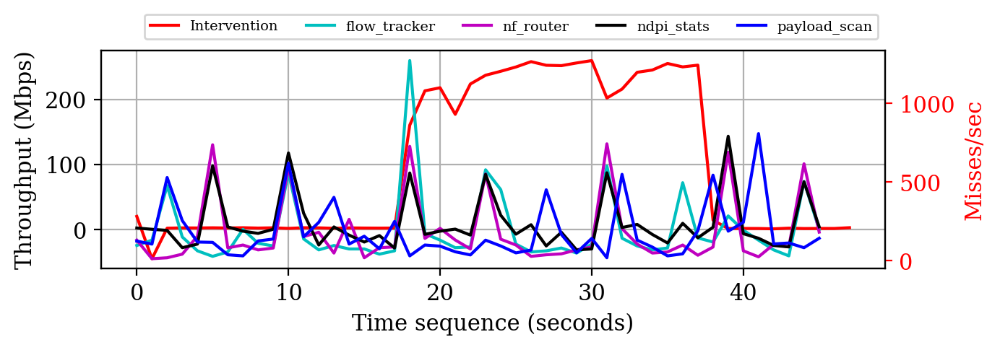

In [115]:
plot_feature_rs("node-load-misses", "Misses/sec")

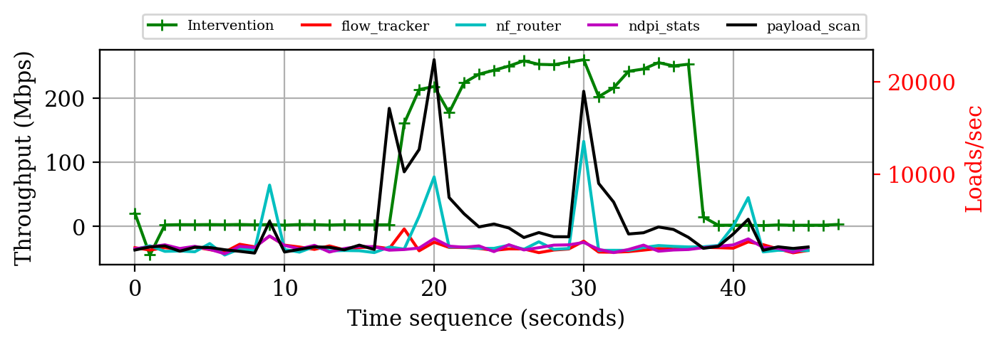

In [116]:
plot_feature_rs("node-loads", "Loads/sec")

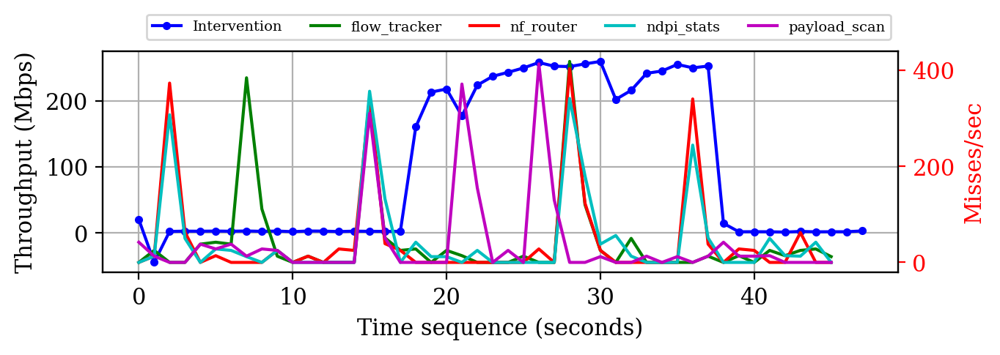

In [117]:
plot_feature_rs("node-store-misses", "Misses/sec")

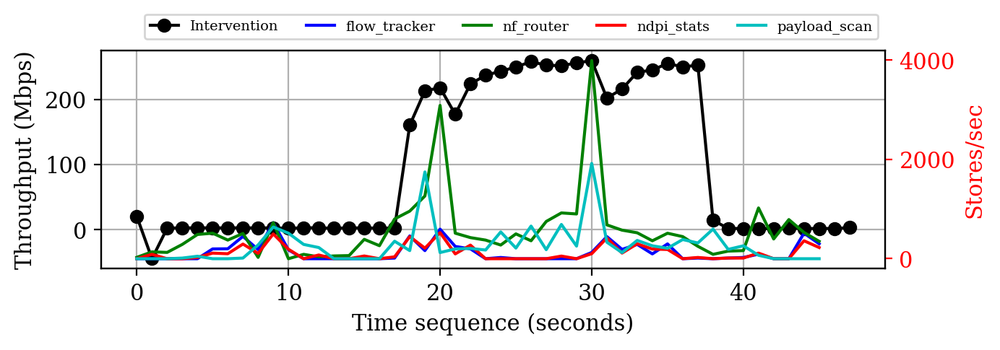

In [118]:
plot_feature_rs("node-stores", "Stores/sec")

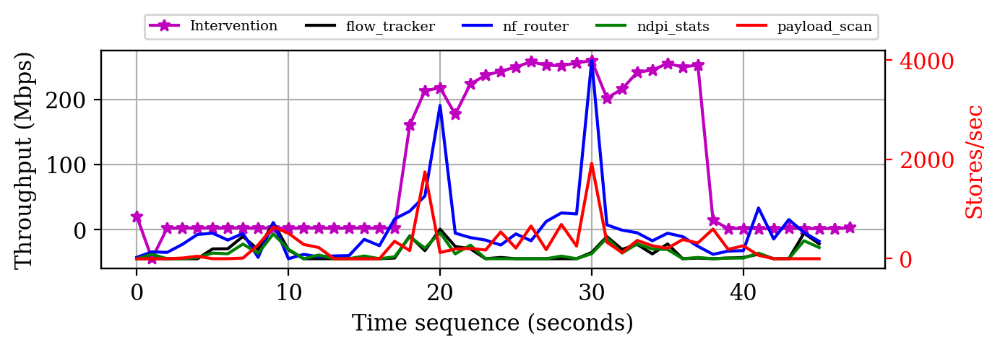

In [119]:
plot_feature_rs("node-stores", "Stores/sec")

### Case 4: stress-testing nDPI

In [120]:
from IPython.display import IFrame
IFrame("./case4.pdf", width=600, height=420)

In [121]:
exp_rs = "exp-9-3-5"

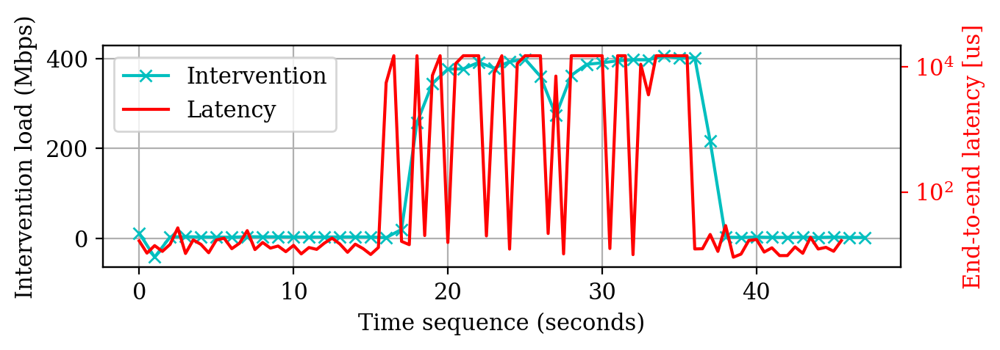

In [122]:
fig, ax = plt.subplots(figsize = (7,2))
ax.grid(True)
ax.set_xlabel("Time sequence (seconds)")
ax.set_ylabel("Intervention load (Mbps)")

ax2 = ax.twinx()
ax2.tick_params(axis='y', colors='red')
ax2.set_ylabel("End-to-end latency [us]", color="red")

tx = np.asarray(parse_seq("resource_stimulus", exp_rs, "tx_stats.csv"))
rx = np.asarray(parse_seq("resource_stimulus", exp_rs, "rx_stats.csv"))

diff = tx-rx

l = ax.plot(diff, marker=next(marker), color=next(cycol), label="Intervention")
lat = parse_seq("resource_stimulus", exp_rs, "latency.csv")
ax2.set_yscale("log")
l2 = ax2.plot(0.5*np.arange(0, len(lat)), lat, color="red", label="Latency")

lns = l+l2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs)

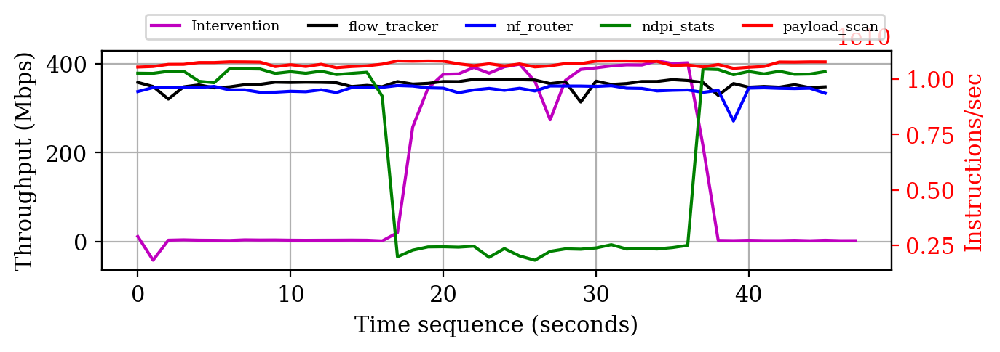

In [123]:
plot_feature_rs("instructions,", "Instructions/sec",)

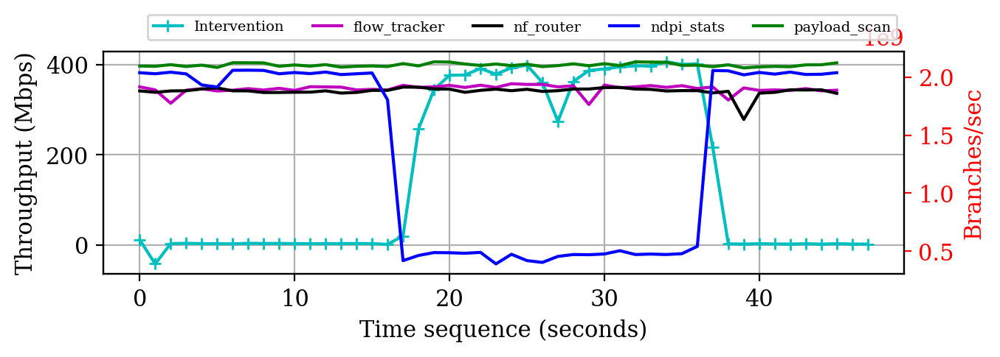

In [124]:
plot_feature_rs("branches,", "Branches/sec",)

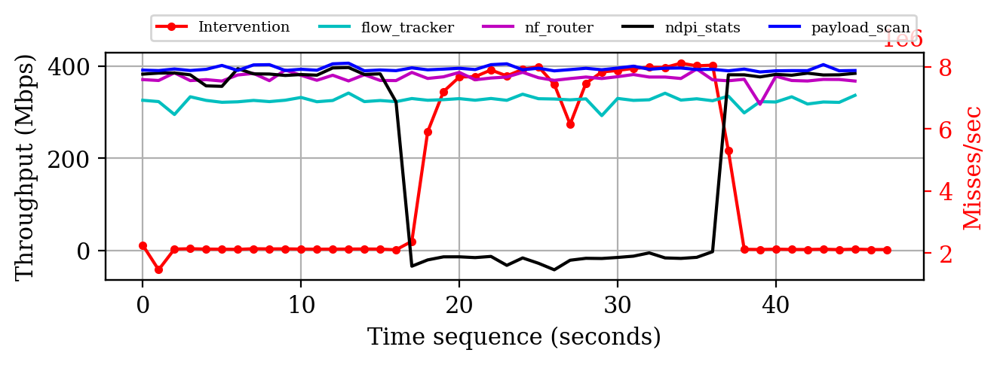

In [125]:
plot_feature_rs("branch-misses", "Misses/sec",)

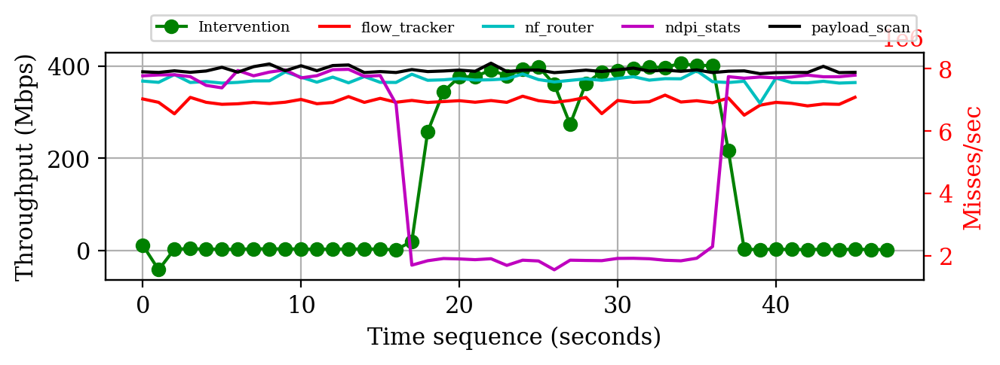

In [126]:
plot_feature_rs("branch-load-misses", "Misses/sec",)

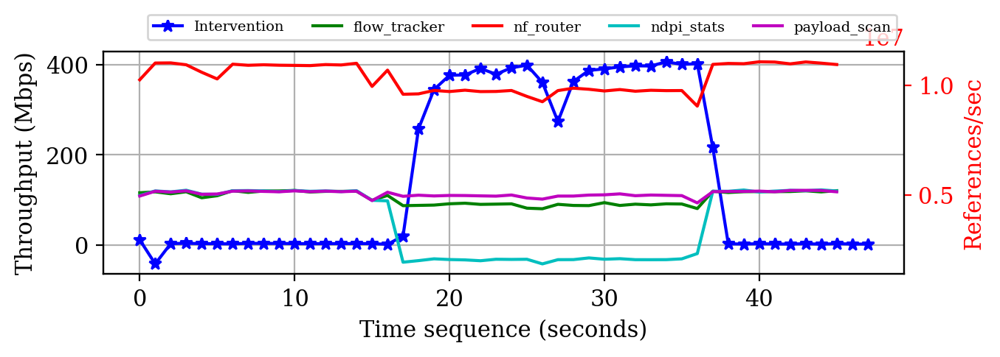

In [127]:
plot_feature_rs("cache-references", "References/sec",)

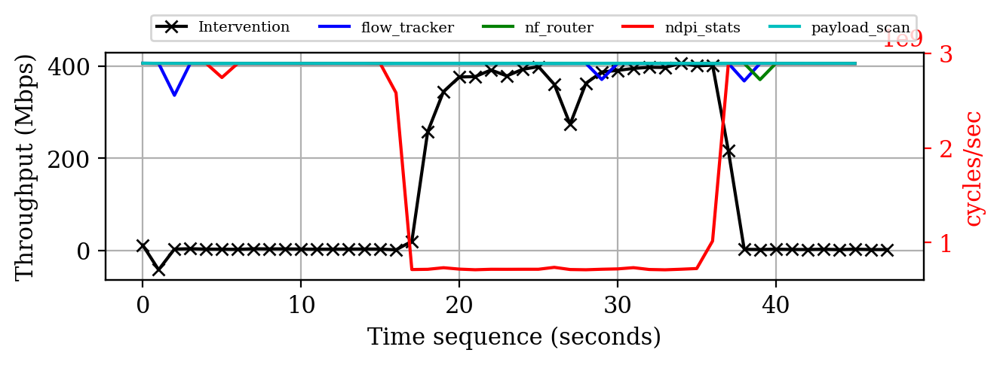

In [128]:
plot_feature_rs(",cycles", "cycles/sec",)

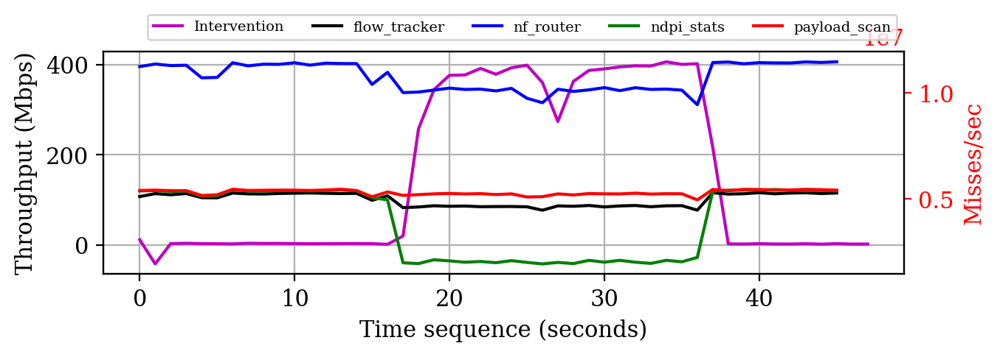

In [129]:
plot_feature_rs("L1-dcache-load-misses", "Misses/sec",)

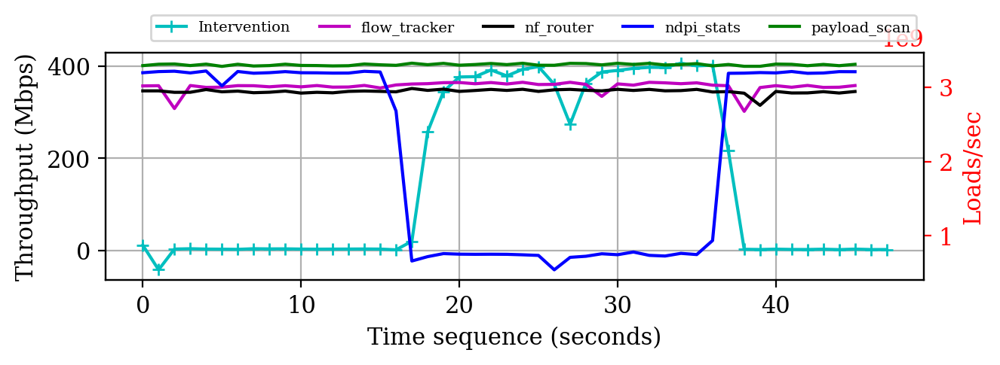

In [130]:
plot_feature_rs("L1-dcache-loads", "Loads/sec",)

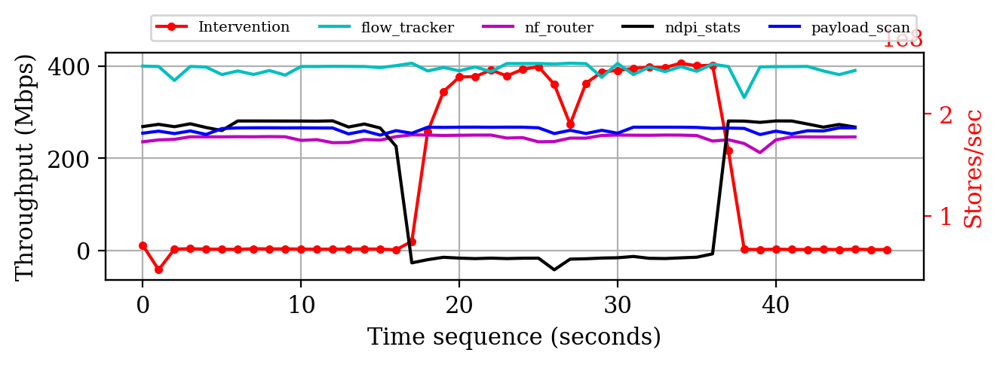

In [131]:
plot_feature_rs("L1-dcache-stores", "Stores/sec",)

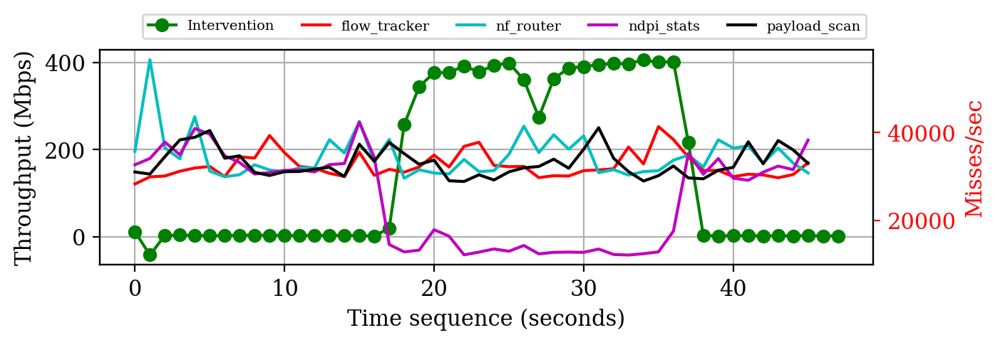

In [132]:
plot_feature_rs("L1-icache-load-misses", "Misses/sec",)

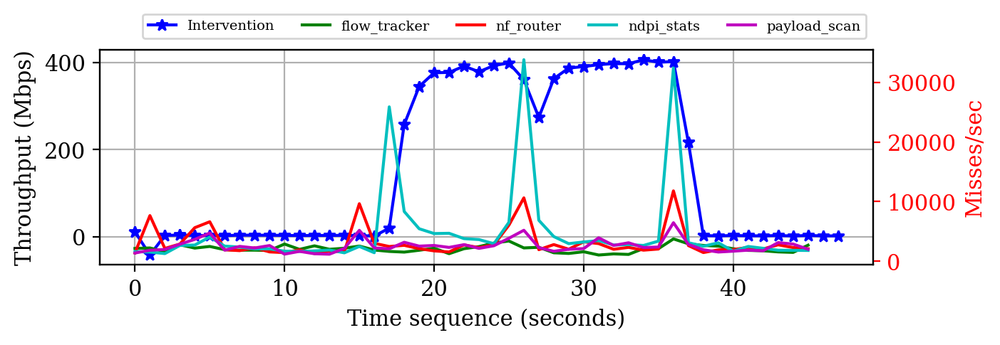

In [133]:
plot_feature_rs("LLC-load-misses", "Misses/sec",)

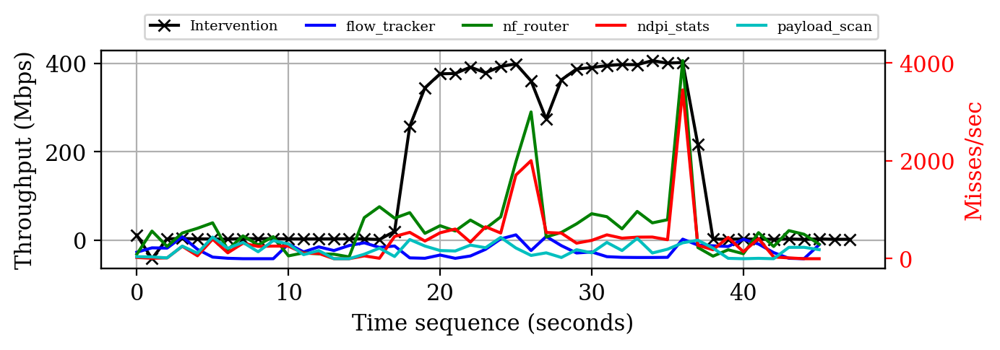

In [134]:
plot_feature_rs("LLC-store-misses", "Misses/sec",)

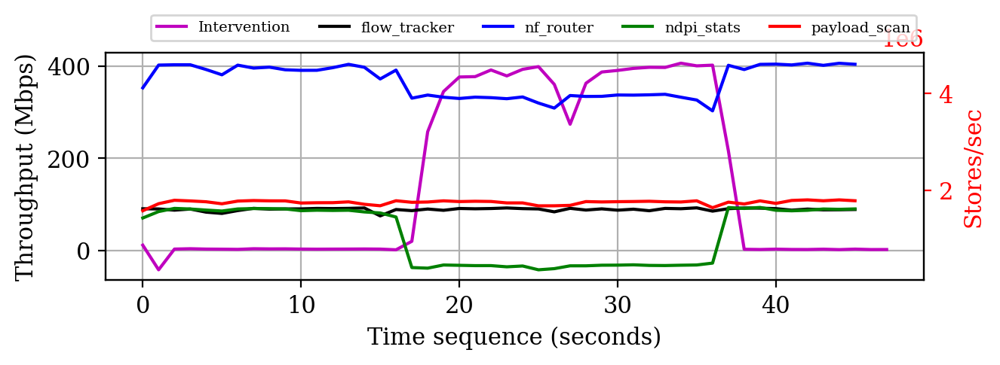

In [135]:
plot_feature_rs("LLC-stores", "Stores/sec",)

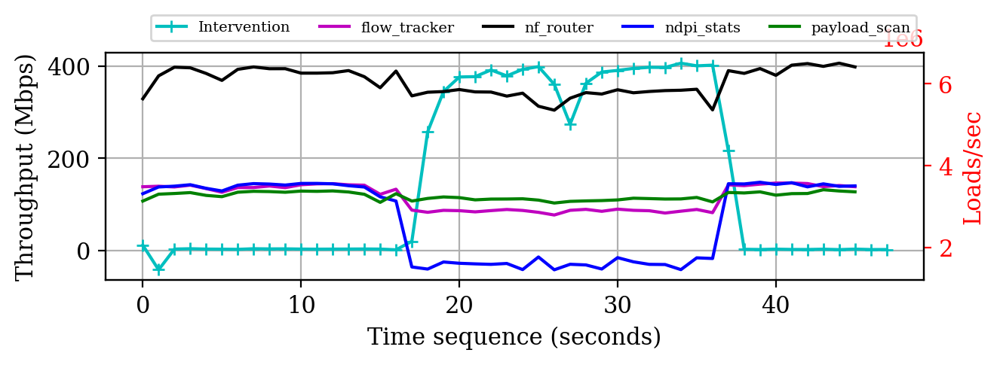

In [136]:
plot_feature_rs("LLC-loads", "Loads/sec",)

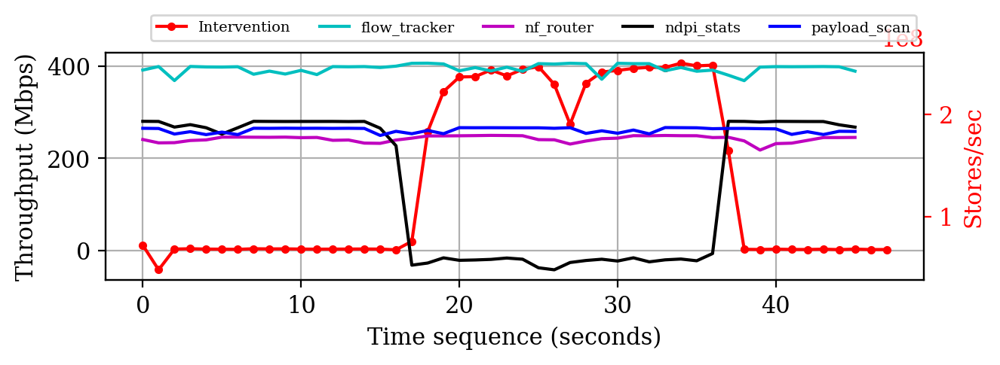

In [137]:
plot_feature_rs("dTLB-stores", "Stores/sec",)

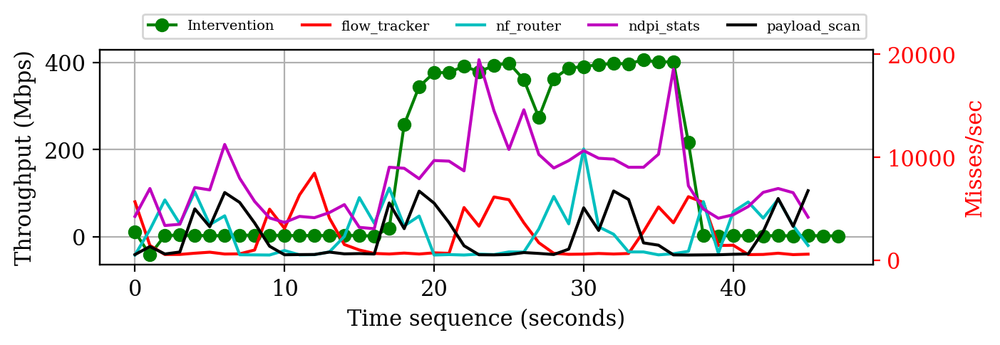

In [138]:
plot_feature_rs("dTLB-load-misses", "Misses/sec",)

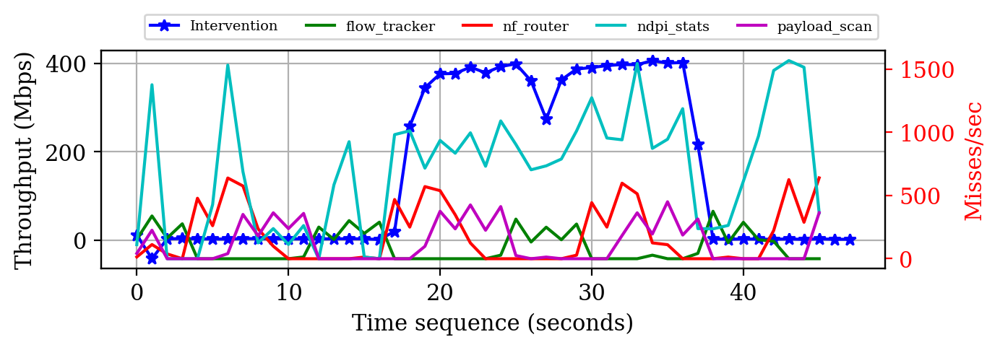

In [139]:
plot_feature_rs("dTLB-store-misses", "Misses/sec",)

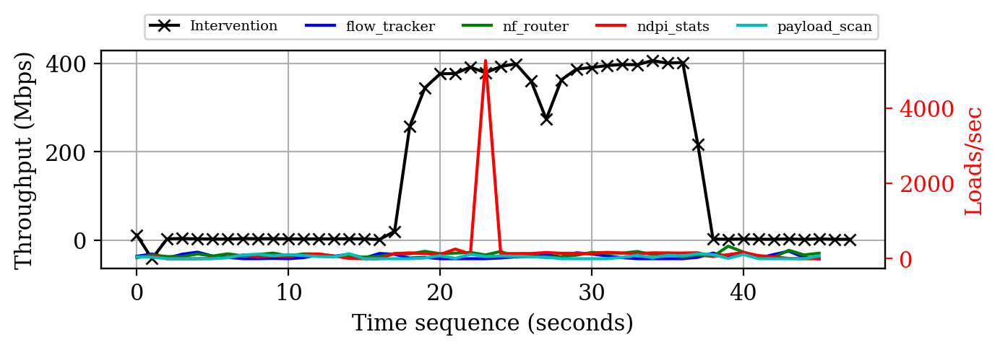

In [140]:
plot_feature_rs("iTLB-loads", "Loads/sec",)

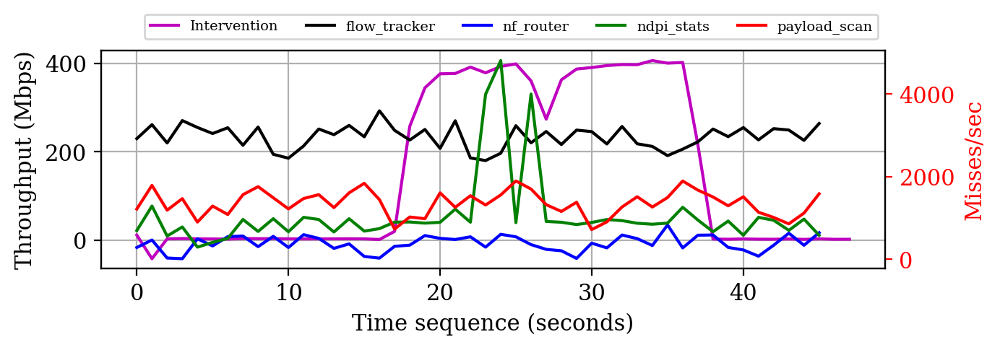

In [141]:
plot_feature_rs("iTLB-load-misses", "Misses/sec",)

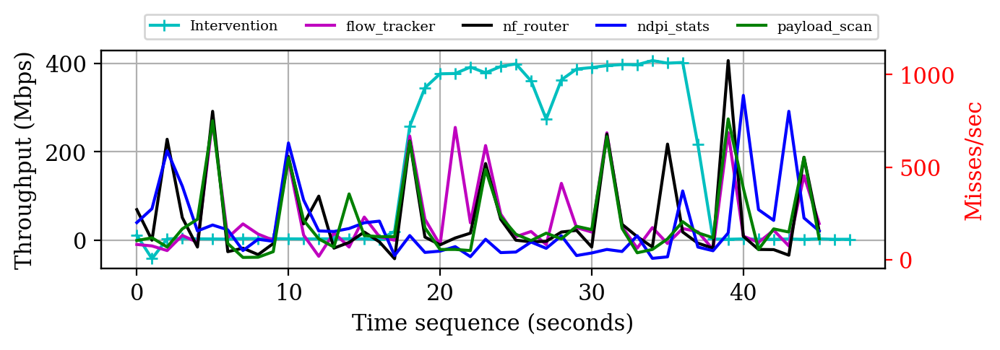

In [142]:
plot_feature_rs("node-load-misses", "Misses/sec",)

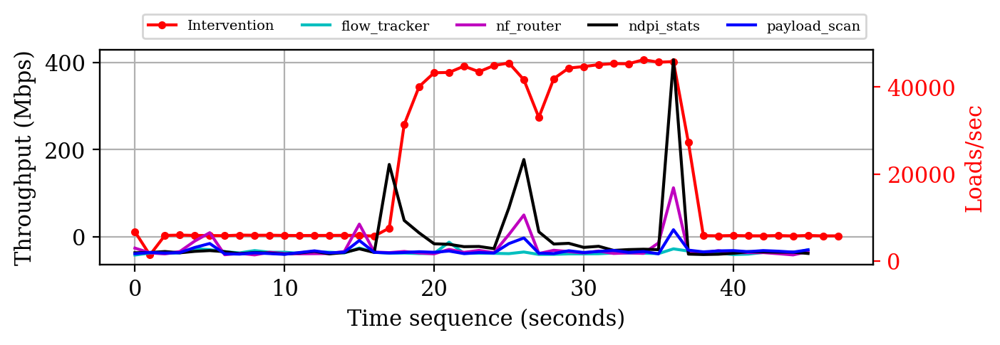

In [143]:
plot_feature_rs("node-loads", "Loads/sec",)

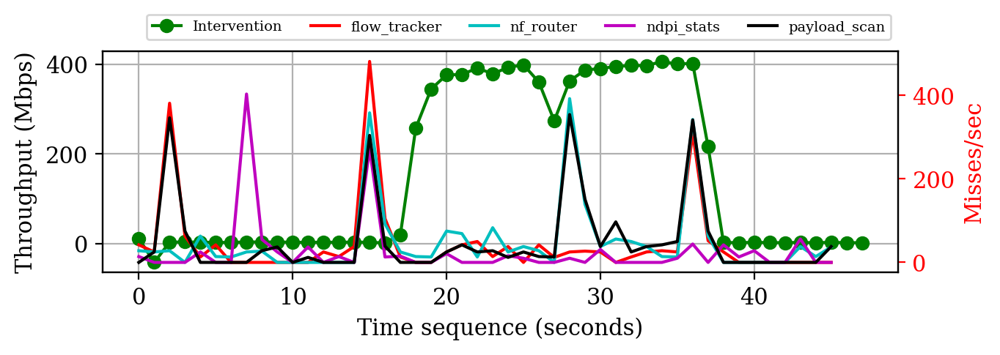

In [144]:
plot_feature_rs("node-store-misses", "Misses/sec",)

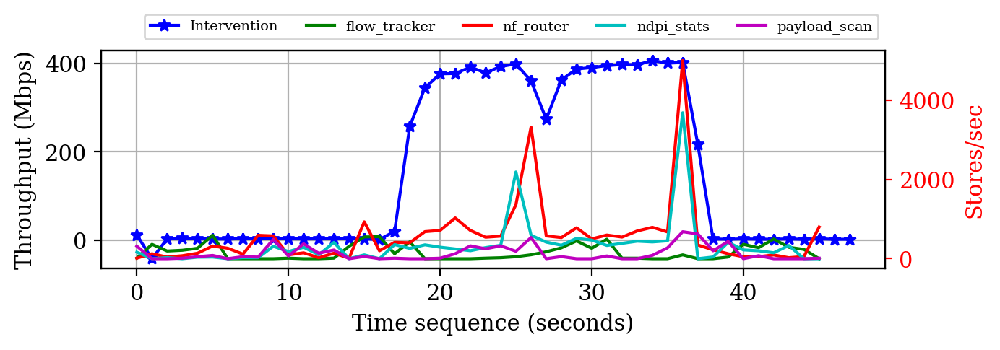

In [145]:
plot_feature_rs("node-stores", "Stores/sec",)

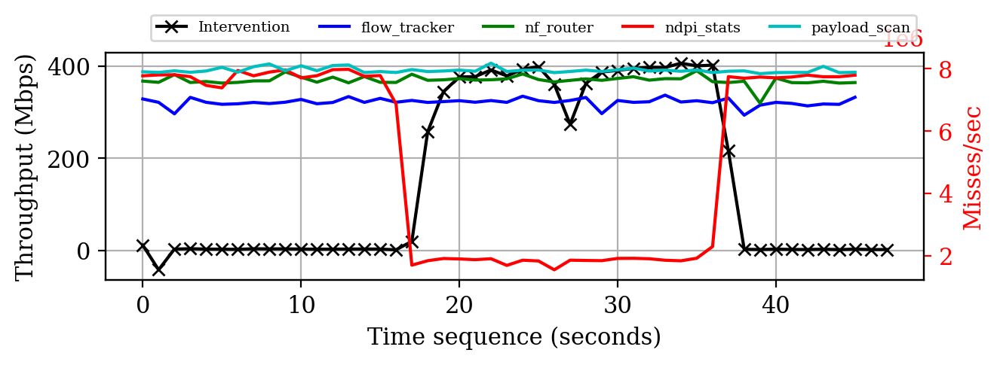

In [146]:
plot_feature_rs("branch-load-misses", "Misses/sec",)

In [147]:
exp_rs = "exp-9-3-5"

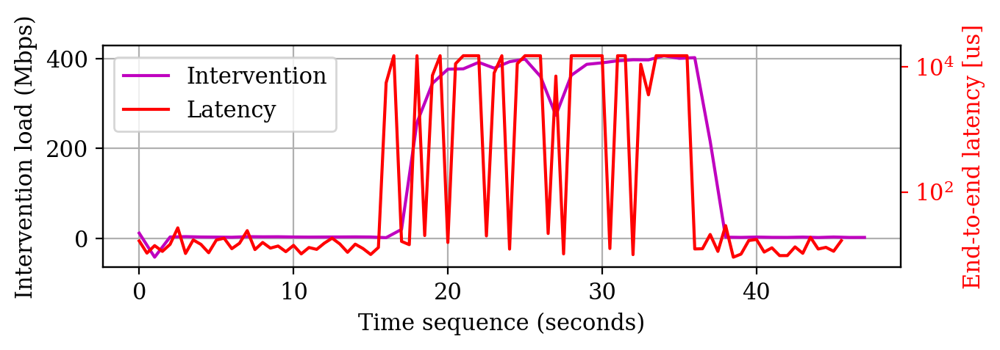

In [148]:
fig, ax = plt.subplots(figsize = (7,2))
ax.grid(True)
ax.set_xlabel("Time sequence (seconds)")
ax.set_ylabel("Intervention load (Mbps)")

ax2 = ax.twinx()
ax2.tick_params(axis='y', colors='red')
ax2.set_ylabel("End-to-end latency [us]", color="red")

tx = np.asarray(parse_seq("resource_stimulus", exp_rs, "tx_stats.csv"))
rx = np.asarray(parse_seq("resource_stimulus", exp_rs, "rx_stats.csv"))

diff = tx-rx

l = ax.plot(diff, marker=next(marker), color=next(cycol), label="Intervention")
lat = parse_seq("resource_stimulus", exp_rs, "latency.csv")
ax2.set_yscale("log")
l2 = ax2.plot(0.5*np.arange(0, len(lat)), lat, color="red", label="Latency")

lns = l+l2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs)

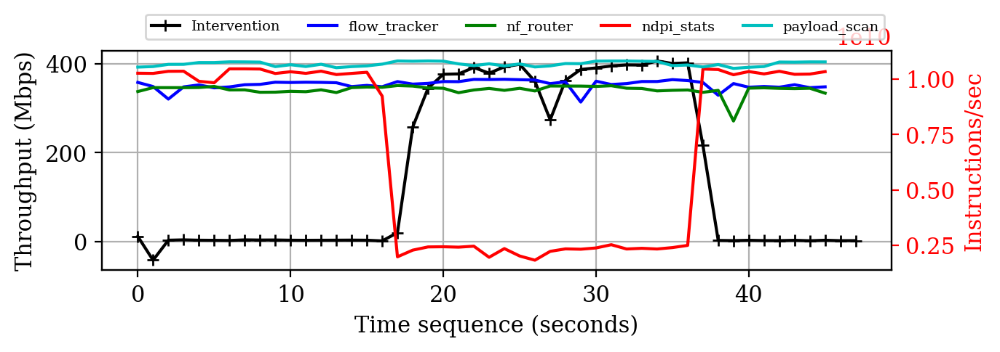

In [149]:
plot_feature_rs("instructions,", "Instructions/sec",)

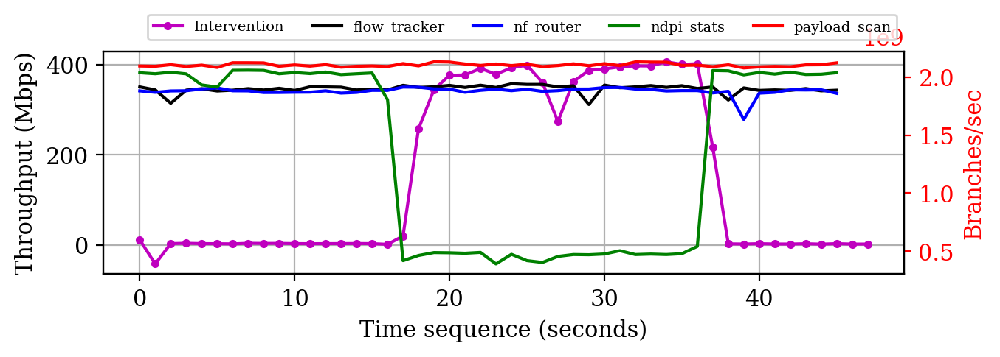

In [150]:
plot_feature_rs("branches,", "Branches/sec",)

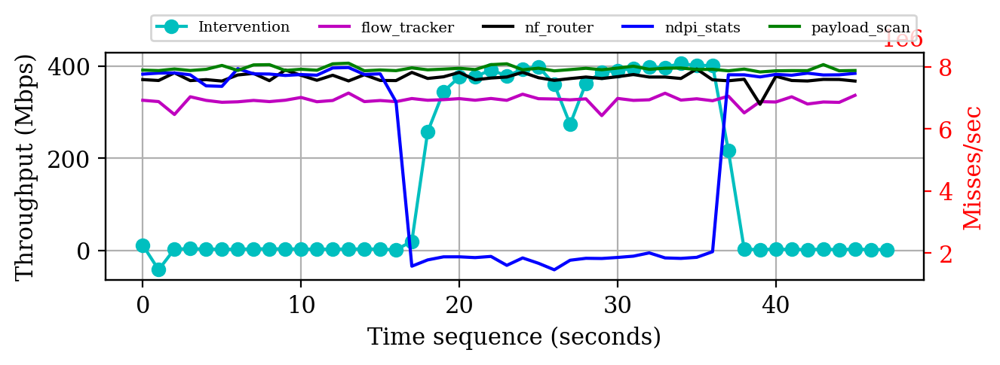

In [151]:
plot_feature_rs("branch-misses", "Misses/sec",)

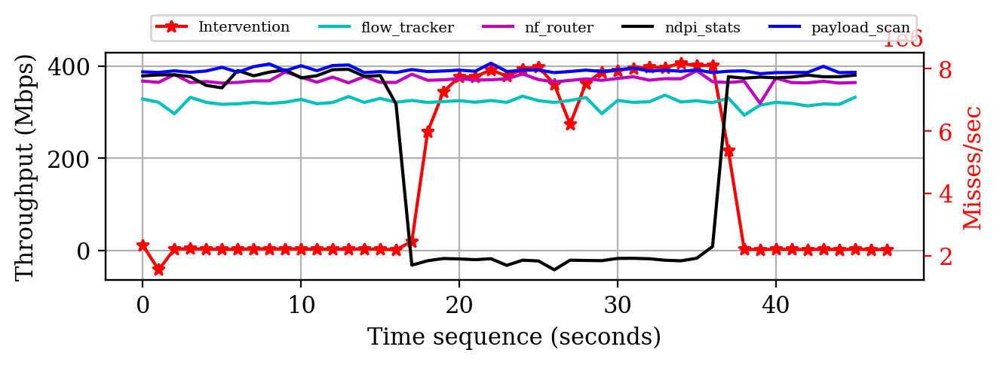

In [152]:
plot_feature_rs("branch-load-misses", "Misses/sec",)

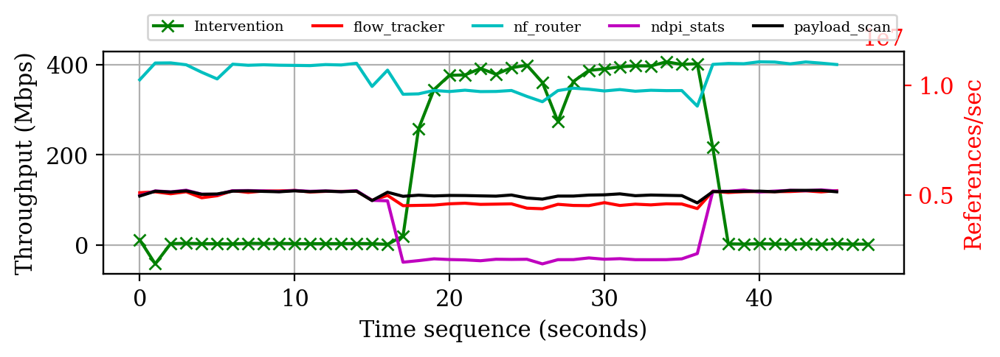

In [153]:
plot_feature_rs("cache-references", "References/sec",)

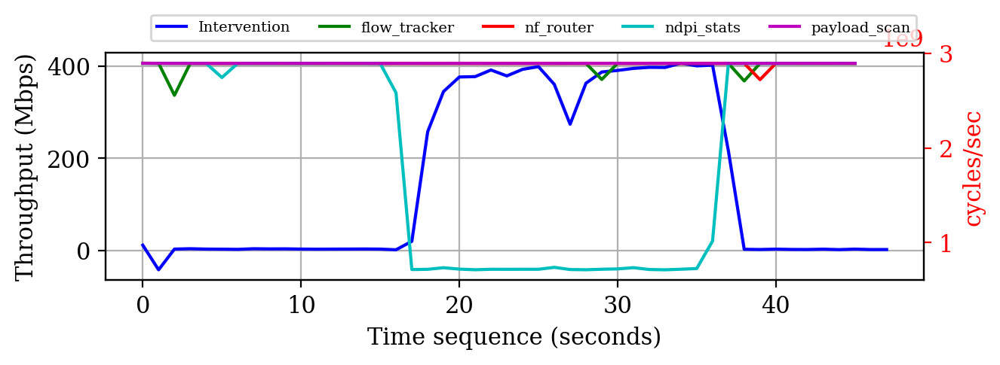

In [154]:
plot_feature_rs(",cycles,", "cycles/sec",)

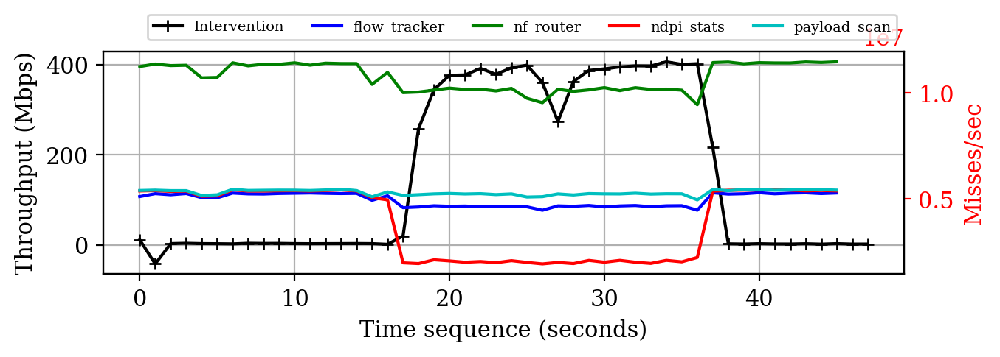

In [155]:
plot_feature_rs("L1-dcache-load-misses", "Misses/sec",)

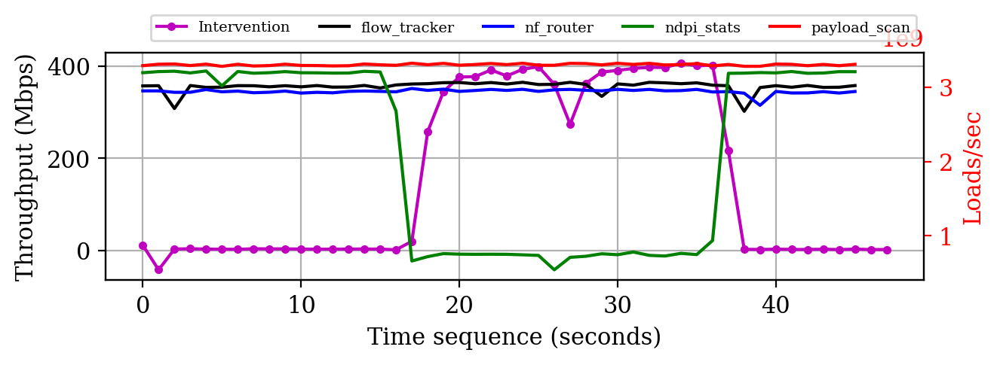

In [156]:
plot_feature_rs("L1-dcache-loads", "Loads/sec",)

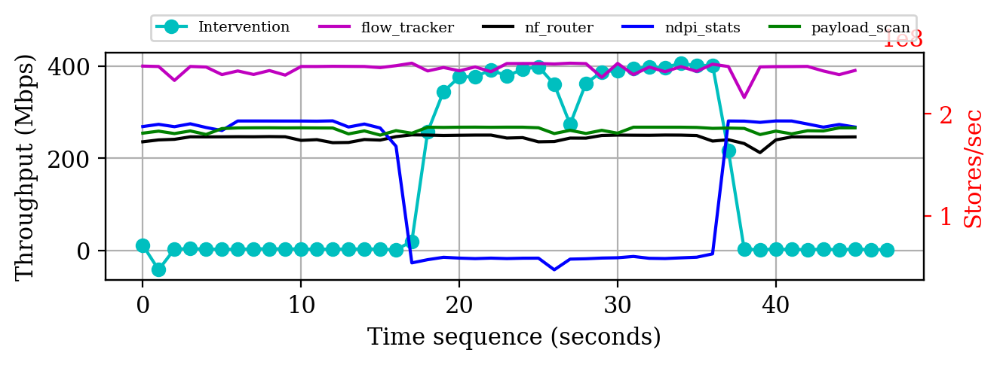

In [157]:
plot_feature_rs("L1-dcache-stores", "Stores/sec",)

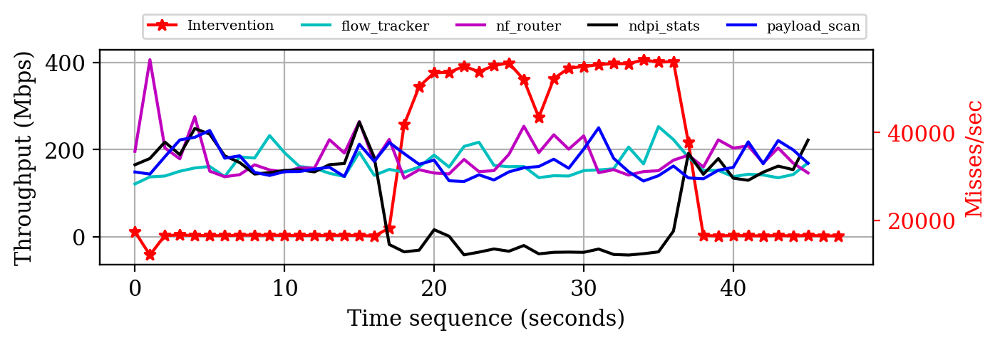

In [158]:
plot_feature_rs("L1-icache-load-misses", "Misses/sec",)

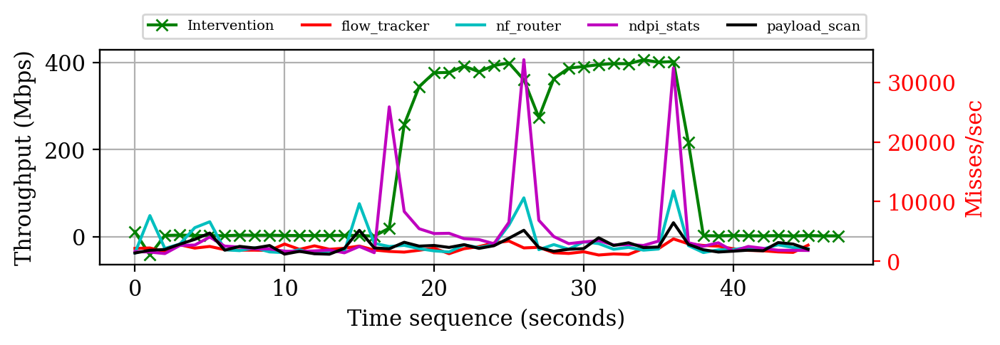

In [159]:
plot_feature_rs("LLC-load-misses", "Misses/sec",)

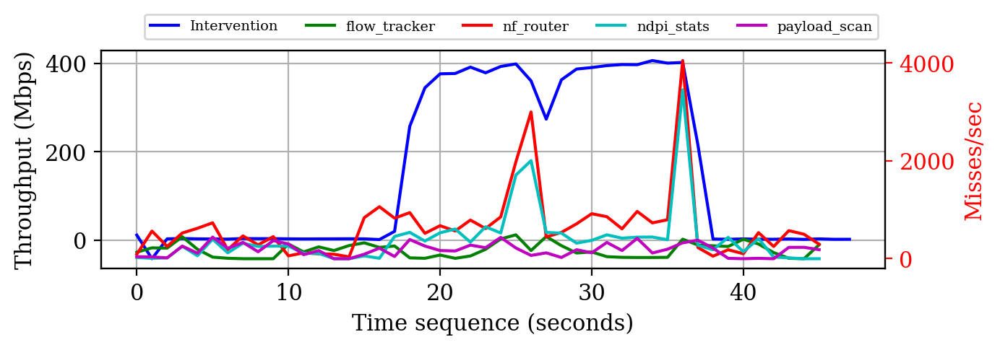

In [160]:
plot_feature_rs("LLC-store-misses", "Misses/sec",)

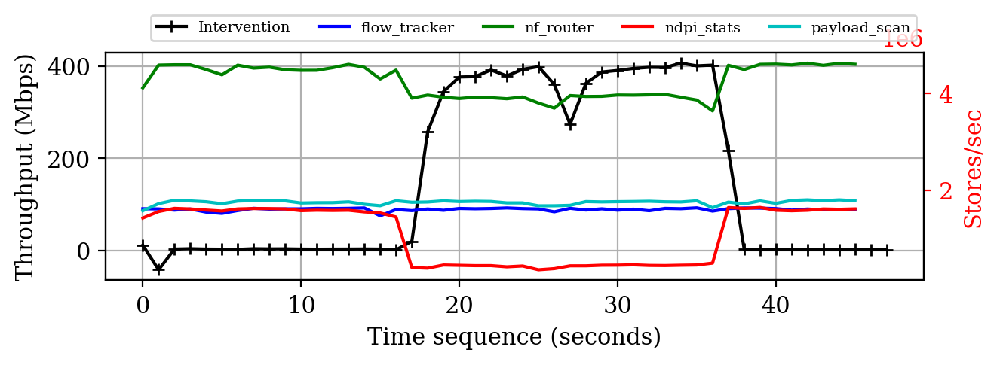

In [161]:
plot_feature_rs("LLC-stores", "Stores/sec",)

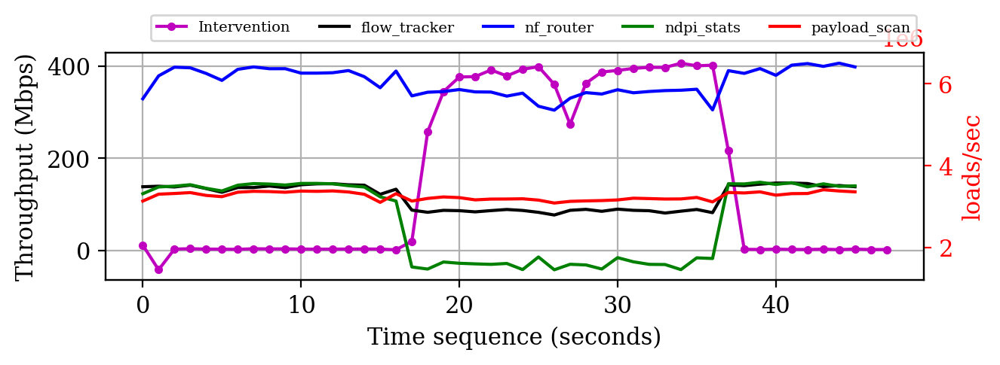

In [162]:
plot_feature_rs("LLC-loads", "loads/sec",)

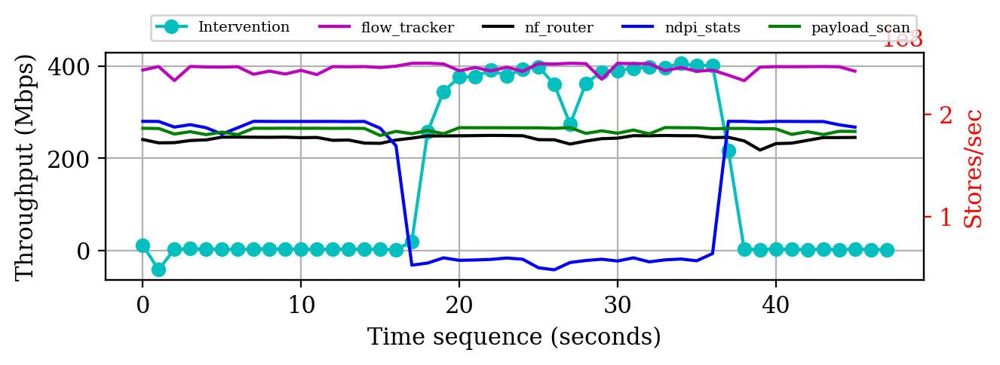

In [163]:
plot_feature_rs("dTLB-stores", "Stores/sec",)

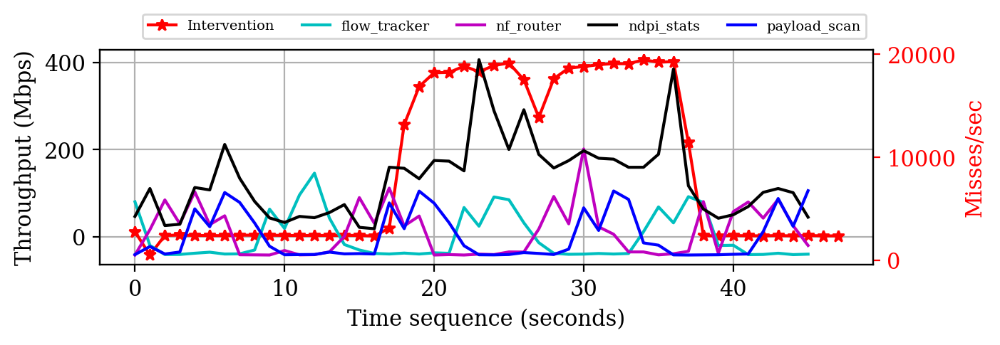

In [164]:
plot_feature_rs("dTLB-load-misses", "Misses/sec",)

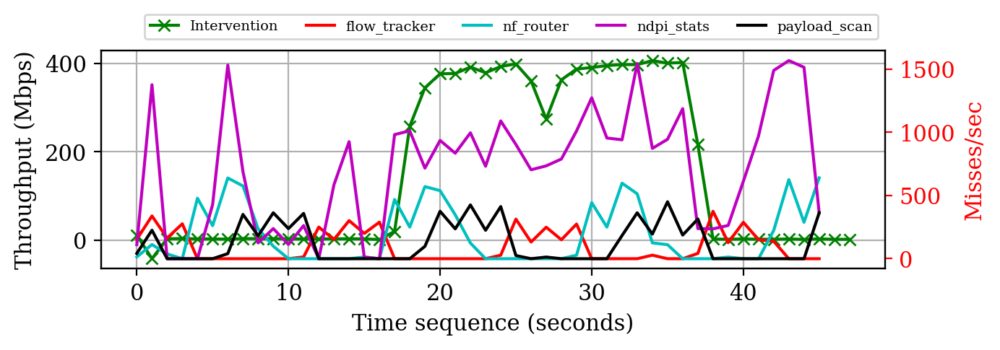

In [165]:
plot_feature_rs("dTLB-store-misses", "Misses/sec",)

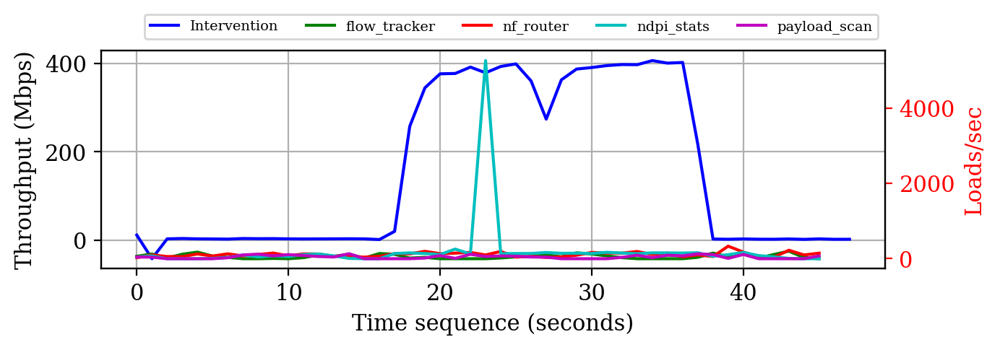

In [166]:
plot_feature_rs("iTLB-loads", "Loads/sec",)

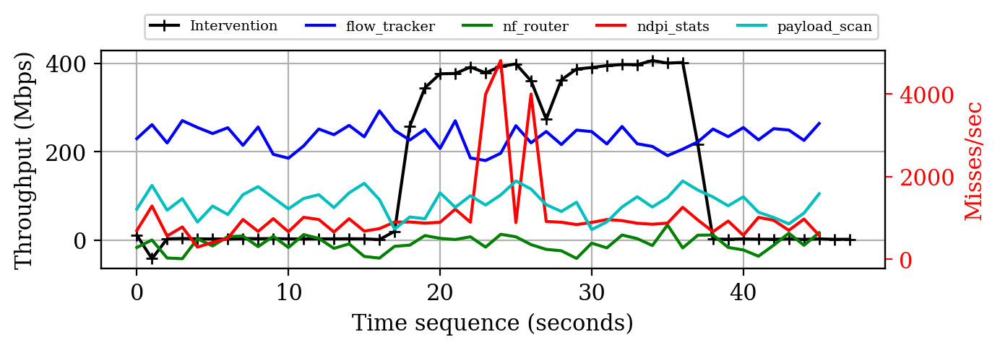

In [167]:
plot_feature_rs("iTLB-load-misses", "Misses/sec",)

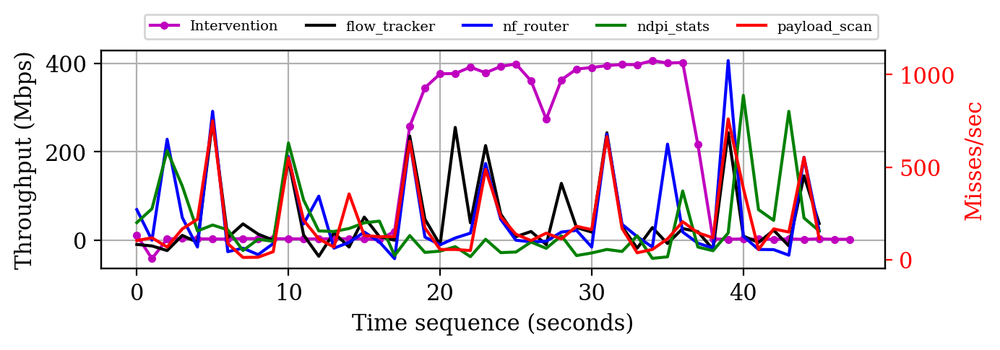

In [168]:
plot_feature_rs("node-load-misse", "Misses/sec",)

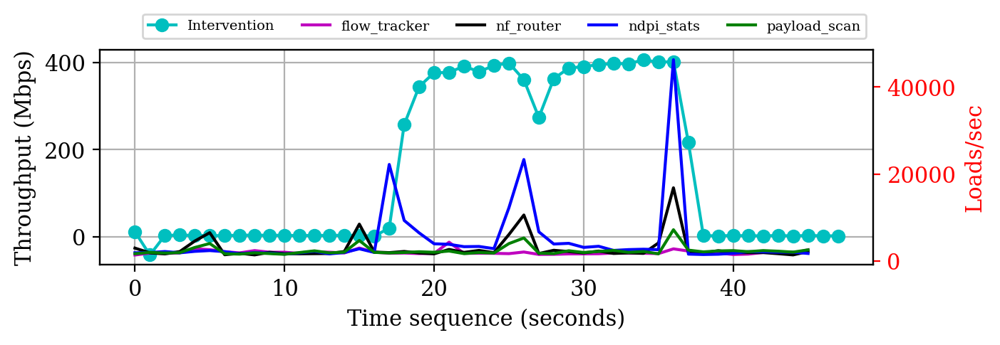

In [169]:
plot_feature_rs("node-loads", "Loads/sec",)

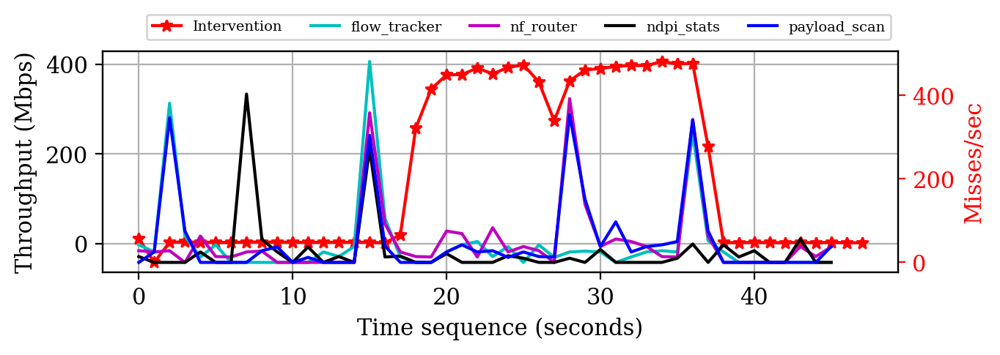

In [170]:
plot_feature_rs("node-store-misses", "Misses/sec",)

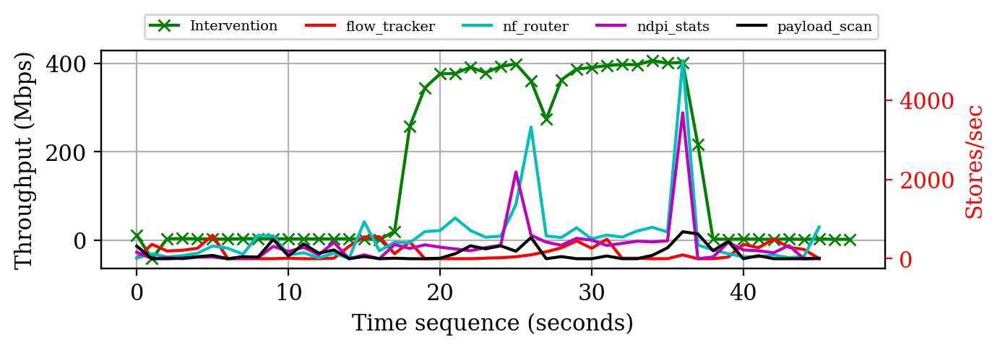

In [171]:
plot_feature_rs("node-stores", "Stores/sec",)